# Organic Vs Recyclable Waste Classifier


In this notebook we will deal with a dataset containing 25,000 images of waste. This task is to build a model to classify this waste into organic waste and recyclable waste. We will experiment with this  to Raspberry Pi hardware with flowing classifiers:
1. CNN
2. Convnext
3. RESnet11 
4. VGG34 
5. Effectlite 
6. MobileNet


# Image Visualization & Processing¶

22564
2513


2025-06-25 08:02:32.360997: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750838552.603887      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750838552.684361      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
100%|██████████| 1401/1401 [00:15<00:00, 92.48it/s]


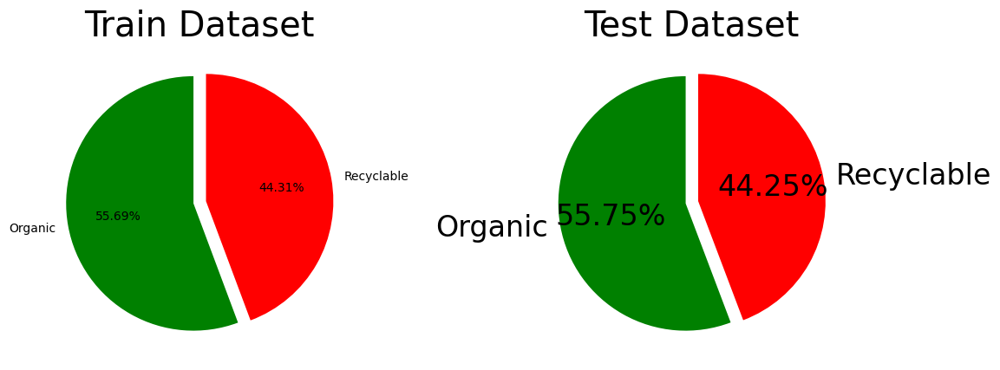

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
import warnings
import os
warnings.filterwarnings('ignore')

train_path0 = "/kaggle/input/waste-classification-data/DATASET/TRAIN/O"
train_path1 = "/kaggle/input/waste-classification-data/DATASET/TRAIN/R"

test_path0 = "/kaggle/input/waste-classification-data/DATASET/TEST/O"
test_path1 = "/kaggle/input/waste-classification-data/DATASET/TEST/R"

import fnmatch

print(len(fnmatch.filter(os.listdir(train_path0), '*.jpg')) +  len(fnmatch.filter(os.listdir(train_path1), '*.jpg')))

print(len(fnmatch.filter(os.listdir(test_path0), '*.jpg')) +  len(fnmatch.filter(os.listdir(test_path1), '*.jpg')))

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense , BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.utils import plot_model
from glob import glob


def load_data(path):
    x_data = []
    y_data = []
    for category in glob(path+'/*'):
        for file in tqdm(glob(category+'/*')):
            img_array = cv2.imread(file)
            img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)
            x_data.append(img_array)
            y_data.append(category.split('/')[-1])
    data = pd.DataFrame({'image' : x_data, 'label' : y_data})
    return data

train_path = "/kaggle/input/waste-classification-data/DATASET/TRAIN/"
test_path = "/kaggle/input/waste-classification-data/DATASET/TEST/"


# Load train data
train_data = load_data(train_path)
# Load test data
test_data = load_data(test_path)


plt.figure(figsize=(12, 6))


plt.subplot(1, 2, 1)
colors = ['green', 'red']
plt.pie(train_data['label'].value_counts(), 
        labels=['Organic', 'Recyclable'], 
        autopct='%0.2f%%', 
        colors=colors, 
        startangle=90, 
        explode=[0.05, 0.05])
plt.rcParams.update({'font.size': 24})
plt.title('Train Dataset')


plt.subplot(1, 2, 2)
plt.pie(test_data['label'].value_counts(), 
        labels=['Organic', 'Recyclable'], 
        autopct='%0.2f%%', 
        colors=colors, 
        startangle=90, 
        explode=[0.05, 0.05])
plt.title('Test Dataset')
plt.rcParams.update({'font.size': 24})
plt.tight_layout()
plt.show()



# CNN model

## 1. Build Model CNN

2025-06-11 02:37:45.207538: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1749609465.673061      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1749609465.807191      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Found 22564 images belonging to 2 classes.
Found 2513 images belonging to 2 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1749609515.032327      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1749609515.033010      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 222, 222, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 109, 109, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 52, 52, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 52, 52, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │      22,151,424 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │          16,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │              

 Total params: 22,263,426 (84.93 MB)

 Trainable params: 22,262,338 (84.92 MB)

 Non-trainable params: 1,088 (4.25 KB)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30


I0000 00:00:1749609525.237068     109 service.cc:148] XLA service 0x785a2400adc0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1749609525.238688     109 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1749609525.238708     109 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1749609525.953130     109 cuda_dnn.cc:529] Loaded cuDNN version 90300


  2/706 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step - accuracy: 0.5234 - loss: 1.0584   

I0000 00:00:1749609533.352790     109 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


706/706 ━━━━━━━━━━━━━━━━━━━━ 506s 698ms/step - accuracy: 0.7561 - loss: 0.5752 - val_accuracy: 0.8651 - val_loss: 0.3608 - learning_rate: 1.0000e-04
Epoch 2/30
706/706 ━━━━━━━━━━━━━━━━━━━━ 306s 434ms/step - accuracy: 0.8077 - loss: 0.4505 - val_accuracy: 0.8524 - val_loss: 0.3516 - learning_rate: 1.0000e-04
Epoch 3/30
706/706 ━━━━━━━━━━━━━━━━━━━━ 308s 436ms/step - accuracy: 0.8202 - loss: 0.4228 - val_accuracy: 0.8711 - val_loss: 0.3336 - learning_rate: 1.0000e-04
Epoch 4/30
706/706 ━━━━━━━━━━━━━━━━━━━━ 303s 429ms/step - accuracy: 0.8299 - loss: 0.4085 - val_accuracy: 0.8727 - val_loss: 0.3207 - learning_rate: 1.0000e-04
Epoch 5/30
706/706 ━━━━━━━━━━━━━━━━━━━━ 301s 426ms/step - accuracy: 0.8359 - loss: 0.3934 - val_accuracy: 0.8719 - val_loss: 0.3078 - learning_rate: 1.0000e-04
Epoch 6/30
706/706 ━━━━━━━━━━━━━━━━━━━━ 308s 437ms/step - accuracy: 0.8424 - loss: 0.3790 - val_accuracy: 0.8631 - val_loss: 0.3464 - learning_rate: 1.0000e-04
Epoch 7/30
706/706 ━━━━━━━━━━━━━━━━━━━━ 306s 433ms/

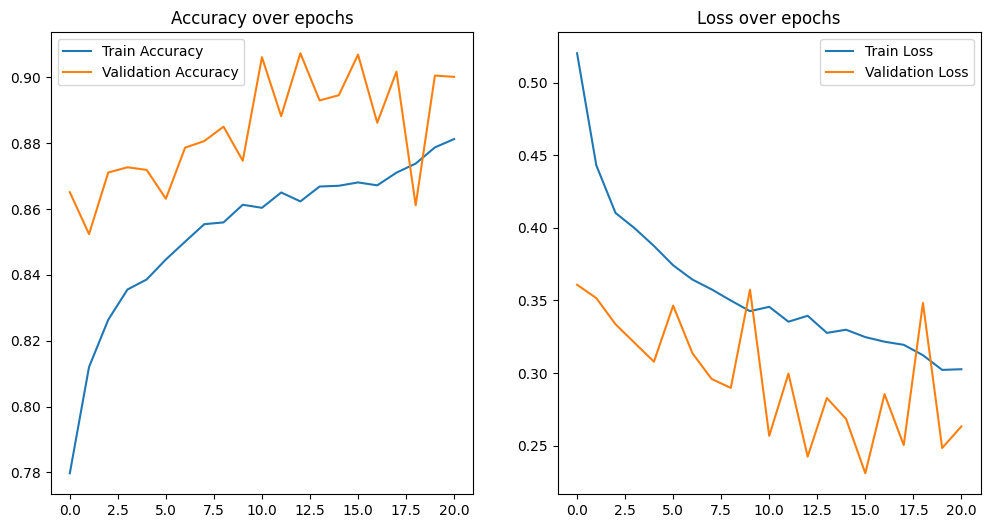

In [1]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense, BatchNormalization
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt
import tensorflow as tf
import os

# Đường dẫn dữ liệu
train_path = "/kaggle/input/waste-classification-data/DATASET/TRAIN/"
test_path = "/kaggle/input/waste-classification-data/DATASET/TEST/"

# Tăng cường dữ liệu
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,             # Quay ngược 30 độ
    width_shift_range=0.2,         # Dịch chuyển ngang 20%
    height_shift_range=0.2,        # Dịch chuyển dọc 20%
    zoom_range=0.2,                # Phóng to/thu nhỏ 20%
    horizontal_flip=True,          # Lật phải/trái
    brightness_range=[0.8, 1.2], # Điều chỉnh độ sáng
)

test_datagen = ImageDataGenerator(
    rescale=1./255,
)

batch_size = 32  # Thay đổi phù hợp hơn
target_size = (224, 224)

# Load dữ liệu
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=target_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Xây dựng mô hình
model = Sequential()

# Conv Block 1
model.add(Conv2D(32, (3, 3), input_shape=(224, 224, 3)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D())

# Conv Block 2
model.add(Conv2D(64, (3, 3)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D())

# Conv Block 3
model.add(Conv2D(128, (3, 3)))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPooling2D())

# Fully connected layers
model.add(Flatten())
model.add(Dense(256))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.5))

model.add(Dense(64))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.5))

# Output layer
model.add(Dense(2, activation='softmax'))  # Dùng softmax cho phân loại đa lớp

# Compile model
model.compile(
    loss='categorical_crossentropy',
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    metrics=['accuracy']
)

# Vẽ mô hình
plot_model(model, to_file='cnn_model.png', show_shapes=True, show_layer_names=True)
from IPython.display import Image
Image('cnn_model.png')

model.summary()

# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

# Huấn luyện
history = model.fit(
    train_generator,
    epochs=30,  # Tăng số epochs để có thể tinh chỉnh tốt hơn
    validation_data=test_generator,
    callbacks=[early_stop, reduce_lr]
)

# Lưu mô hình
model.save('waste_classifier_model.h5')

# Vẽ biểu đồ
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy over epochs')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss over epochs')
plt.show()


## 2. Evaluation CNN

In [5]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


# Load model
model = load_model('/kaggle/input/cnn_model/tensorflow2/default/1/waste_classifier_model.h5')

# Test path folders
folder_O = '/kaggle/input/waste-classification-data/DATASET/TEST/O'
folder_R = '/kaggle/input/waste-classification-data/DATASET/TEST/R'

# load image 
def load_y_test(folder, label):
    y_test = []
    y_pred = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path)
        if img is not None:
            # Resize to 224x224
            prediction = predict_fun(img)
            y_test.append(label)
            y_pred.append(prediction)
    return y_test, y_pred
    

def predict_fun(img):
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize to (224x224)
    resized_img = cv2.resize(image_rgb, (224, 224))
    # onvert to float32
    resized_img = resized_img.astype('float32') / 255.0  # Mô hình được huấn luyện với dữ liệu chuẩn hóa 0-1
    # add batch dimension
    input_img = np.expand_dims(resized_img, axis=0)
    # predict
    prediction = model.predict(input_img, verbose=None)
    result = np.argmax(prediction)

    
    if result == 0:
        #print('The image is Organic Waste')
        return 0
    elif result == 1:
        #print('The image is Inorganic Waste')
        return 1
        
y_test_0, y_pred_0 =  load_y_test(folder_O, 0)
y_test_1, y_pred_1 =  load_y_test(folder_R, 1)

y_test = np.array(y_test_0 + y_test_1)
y_pred = np.array(y_pred_0 + y_pred_1)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# confusion matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

# report classification
report = classification_report(y_test, y_pred, target_names=['InOrganic', 'Organic'])
print('Classification Report:')
print(report)

I0000 00:00:1750806445.606110      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9816 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1750806445.606819      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5
I0000 00:00:1750806448.966602     158 service.cc:148] XLA service 0x7de45c09dfa0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1750806448.967498     158 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1750806448.967521     158 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1750806449.084883     158 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1750806450.099650     158 device_compiler.h:188] Compiled cluste

Accuracy: 0.91
Confusion Matrix:
[[1339   62]
 [ 170  942]]
Classification Report:
              precision    recall  f1-score   support

   InOrganic       0.89      0.96      0.92      1401
     Organic       0.94      0.85      0.89      1112

    accuracy                           0.91      2513
   macro avg       0.91      0.90      0.91      2513
weighted avg       0.91      0.91      0.91      2513



## 3. Pruned-CNN Model

In [4]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


# Load model
model = load_model('/kaggle/input/cnn_model/tensorflow2/default/1/waste_classifier_model.h5')


threshold = 0.001

# Iterate through each layer of the model
for layer in model.layers:
    if hasattr(layer, 'weights'):
        weights = layer.get_weights()
        # Update weights
        new_weights = []
        for w in weights:
            w[np.abs(w) < threshold] = 0
            new_weights.append(w)
        layer.set_weights(new_weights)

model.save('pruned_cnn_model.h5')  # save pruned model
print("saved pruned cnn model")

I0000 00:00:1750812526.675103      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1750812526.675788      35 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


saved pruned cnn model


## 5. Quantized-CNN model

In [10]:

import tensorflow as tf
from tensorflow.keras.models import load_model

# Load pruned model
pruned_model = tf.keras.models.load_model('/kaggle/working/pruned_cnn_model.h5')

converter = tf.lite.TFLiteConverter.from_keras_model(pruned_model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_quantized_model = converter.convert()

# save quantized model
with open('model_cnn_quantized.tflite', 'wb') as f:
    f.write(tflite_quantized_model)

Saved artifact at '/tmp/tmpusz3r6z8'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer')
Output Type:
  TensorSpec(shape=(None, 2), dtype=tf.float32, name=None)
Captures:
  138148516236176: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138148516234448: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138148516240592: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138148516234256: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138148516236368: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138148516235408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138148516248848: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138148516235792: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138148516240976: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138148527207248: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138148516234064

W0000 00:00:1750817909.146040      35 tf_tfl_flatbuffer_helpers.cc:365] Ignored output_format.
W0000 00:00:1750817909.146089      35 tf_tfl_flatbuffer_helpers.cc:368] Ignored drop_control_dependency.
I0000 00:00:1750817909.162703      35 mlir_graph_optimization_pass.cc:401] MLIR V1 optimization pass is not enabled


## 6. Evaluation PQ-CNN model

In [12]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time

# Test path folders
folder_O = '/kaggle/input/waste-classification-data/DATASET/TEST/O'
folder_R = '/kaggle/input/waste-classification-data/DATASET/TEST/R'

model_path = '/kaggle/input/quantized-cnn-model/tensorflow2/default/1/quantized_cnn_model.tflite'

# Load model TFLite
def load_tflite_model(model_path):
    interpreter = tf.lite.Interpreter(model_path=model_path)
    interpreter.allocate_tensors()
    return interpreter

# Function to preprocess images
def preprocess_image(image_path, input_size):
    # Read image
    img = cv2.imread(image_path)
    # Convert to RGB 
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image
    img_resized = cv2.resize(img, input_size)
    # Normalize the image 
    img_normalized = img_resized.astype(np.float32) / 255.0
    # Add batch dimension
    input_data = np.expand_dims(img_normalized, axis=0)
    return input_data

# predict function
def predict_image(interpreter, input_data):
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    # Assign data to model
    interpreter.set_tensor(input_details[0]['index'], input_data)
    interpreter.invoke()

    # Get the prediction results
    output_data = interpreter.get_tensor(output_details[0]['index'])
    return output_data

interpreter = load_tflite_model(model_path)

def predict_fun(image_path):
    # Get the input dimensions of the model
    input_details = interpreter.get_input_details()
    input_shape = input_details[0]['shape']
    input_size = (input_shape[1], input_shape[2])  # (width, height)

    # Image preprocessing
    input_data = preprocess_image(image_path, input_size)

    # Predict
    predictions = predict_image(interpreter, input_data)

    predicted_class = np.argmax(predictions)
    if predicted_class == 0:
        return 0
    else:
        return 1

# load image 
def load_y_test(folder, label):
    y_test = []
    y_pred = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)

        if img_path is not None:
            # Resize to 224x224
            prediction = predict_fun(img_path)
            y_test.append(label)
            y_pred.append(prediction)
    return y_test, y_pred
          
y_test_0, y_pred_0 =  load_y_test(folder_O, 0)
y_test_1, y_pred_1 =  load_y_test(folder_R, 1)

y_test = np.array(y_test_0 + y_test_1)
y_pred = np.array(y_pred_0 + y_pred_1)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# confusion matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

# report classification
report = classification_report(y_test, y_pred, target_names=['InOrganic', 'Organic'])
print('Classification Report:')
print(report)

Accuracy: 0.91
Confusion Matrix:
[[1331   70]
 [ 165  947]]
Classification Report:
              precision    recall  f1-score   support

   InOrganic       0.89      0.95      0.92      1401
     Organic       0.93      0.85      0.89      1112

    accuracy                           0.91      2513
   macro avg       0.91      0.90      0.90      2513
weighted avg       0.91      0.91      0.91      2513



## 7. Example Predict

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


The image is INORGANIC
Time process: 0.6995651721954346 s
The image is INORGANIC
Time process: 0.05991554260253906 s
The image is INORGANIC
Time process: 0.05693769454956055 s
The image is INORGANIC
Time process: 0.059070587158203125 s
The image is ORGANIC
Time process: 0.05639505386352539 s
The image is INORGANIC
Time process: 0.056534767150878906 s


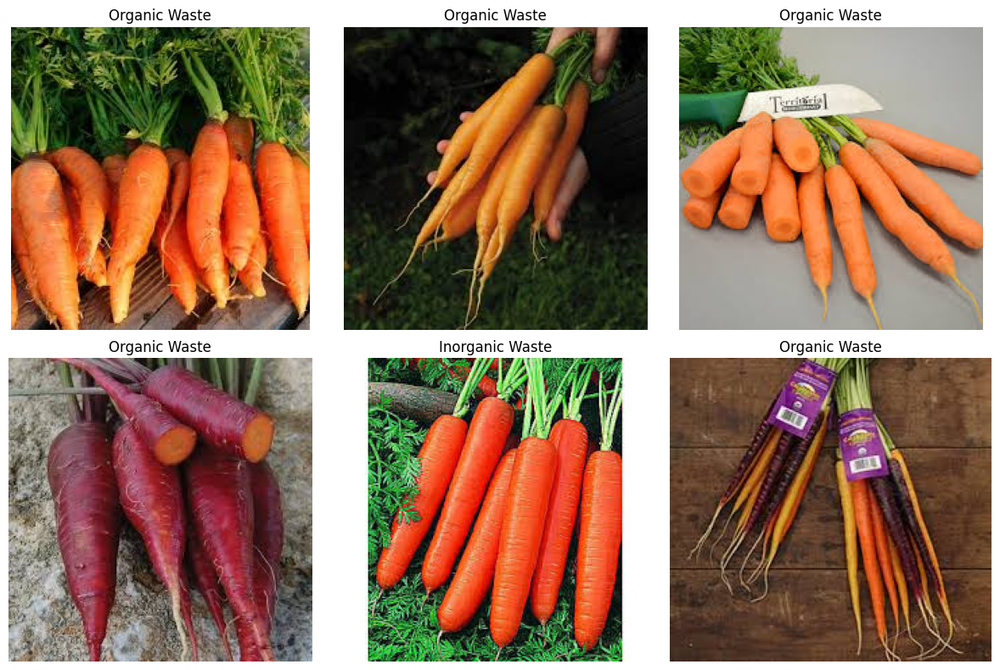

The image is ORGANIC
Time process: 0.05638241767883301 s
The image is ORGANIC
Time process: 0.05402493476867676 s
The image is ORGANIC
Time process: 0.05456042289733887 s
The image is INORGANIC
Time process: 0.053131818771362305 s
The image is ORGANIC
Time process: 0.056746482849121094 s
The image is INORGANIC
Time process: 0.05535483360290527 s


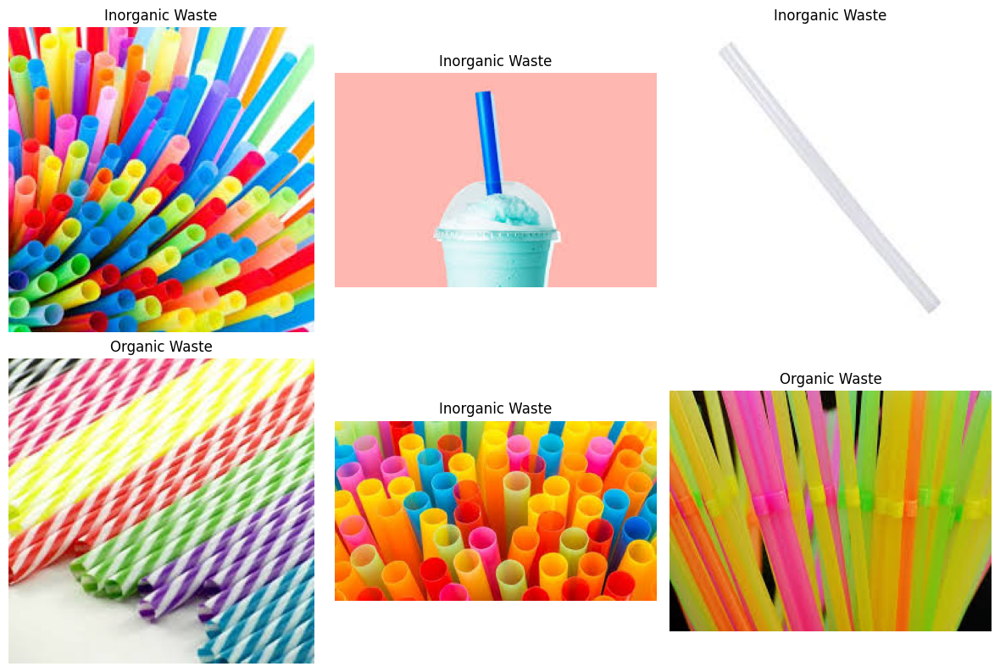

Average processing time per image: 0.05626721382141113 s


In [4]:
import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time


model_path = '/kaggle/input/quantized-cnn-model/tensorflow2/default/1/quantized_cnn_model.tflite'
# Load model TFLite
def load_tflite_model(model_path):
    interpreter = tf.lite.Interpreter(model_path=model_path)
    interpreter.allocate_tensors()
    return interpreter

# Function to preprocess images
def preprocess_image(image_path, input_size):
    # Read image
    img = cv2.imread(image_path)
    # Convert to RGB 
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image
    img_resized = cv2.resize(img, input_size)
    # Normalize the image 
    img_normalized = img_resized.astype(np.float32) / 255.0
    # Add batch dimension
    input_data = np.expand_dims(img_normalized, axis=0)
    return input_data

# predict function
def predict_image(interpreter, input_data):
    input_details = interpreter.get_input_details()
    output_details = interpreter.get_output_details()

    # Assign data to model
    interpreter.set_tensor(input_details[0]['index'], input_data)
    interpreter.invoke()

    # Get the prediction results
    output_data = interpreter.get_tensor(output_details[0]['index'])
    return output_data
    
def predict_fun(image_path):
    # Load model
    interpreter = load_tflite_model(model_path)

    # Get the input dimensions of the model
    input_details = interpreter.get_input_details()
    input_shape = input_details[0]['shape']
    input_size = (input_shape[1], input_shape[2])  # (width, height)

    # Image preprocessing
    input_data = preprocess_image(image_path, input_size)

    # Predict
    predictions = predict_image(interpreter, input_data)

    predicted_class = np.argmax(predictions)
    if predicted_class == 0:
        print("The image is INORGANIC")
        return 'Organic Waste';
    else:
        print("The image is ORGANIC")
        return 'Inorganic Waste';
   
        
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  
all_time = 0
for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_' + str(12568+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i != 0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  

for i in range(6):
    # create figure
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_' + str(10400+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i != 0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  

plt.tight_layout()
plt.show()

print(f"Average processing time per image: {all_time/10} s")

## 8. Compare size of CNN, pruned, quantizationed model.

In [7]:
import os
def getsize(path):
    return os.path.getsize(path)


path_cnn = '/kaggle/input/cnn_model/tensorflow2/default/1/waste_classifier_model.h5'
path_quantized_cnn = '/kaggle/input/quantized-cnn-model/tensorflow2/default/1/quantized_cnn_model.tflite'
path_pruned_cnn= '/kaggle/input/pruned_cnn_model/tensorflow2/default/1/pruned_cnn_model.h5'

print(f"Size of CNN model: {getsize(path_cnn)/1000000}MB")
print(f"Size of Pruned CNN model: {getsize(path_pruned_cnn)/1000000}MB")
print(f"Size of Quantized CNN model: {getsize(path_quantized_cnn)/1000000}MB")

print(f"Quantized CNN model reduce: {getsize(path_cnn)/getsize(path_quantized_cnn)} times")

Size of CNN model: 267.257512MB
Size of Pruned CNN model: 89.14024MB
Size of Quantized CNN model: 22.277072MB
Quantized CNN model reduce: 11.996976622421474 times


# 2. ConvNext

## 2.1. Build ConvNext Model

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import os
from pathlib import Path
from torch.utils.data import DataLoader
import torch.nn.functional as F
import random
import numpy as np



# Đặt device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Đường dẫn dữ liệu
train_dir = "/kaggle/input/waste-classification-data/DATASET/TRAIN/"
test_dir = "/kaggle/input/waste-classification-data/DATASET/TEST/"
model_path = 'convnext_rac_model.pth'


# Hàm huấn luyện
def train(model, loader, criterion, optimizer, epochs=1):
    model.train()
    for epoch in range(epochs):
        total_loss = 0
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            total_loss += loss.item()

        print(f"Epoch [{epoch+1}/{epochs}], Loss: {total_loss/len(loader):.4f}")

# Hàm đánh giá
def evaluate(model, loader):
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)
    print(f'Accuracy: {100 * correct / total:.2f}%')


seed_value = 0
torch.manual_seed(seed_value)
np.random.seed(seed_value)
random.seed(seed_value)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(seed_value)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


# Transform dữ liệu
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Tạo dataset
train_dataset = datasets.ImageFolder(train_dir, transform=transform)
test_dataset = datasets.ImageFolder(test_dir, transform=transform)

# Tạo dataloader
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Khởi tạo mô hình ConvNeXt
model = models.convnext_tiny(pretrained=True)

# Thay đổi lớp cuối để phù hợp với 2 lớp (Vô cơ và Hữu cơ)
model.classifier[2] = nn.Linear(model.classifier[2].in_features, 2)

model = model.to(device)

# Đặt hàm loss và optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=1e-4)


# Đào tạo mô hình
train(model, train_loader, criterion, optimizer, epochs=1)

# Đánh giá mô hình
evaluate(model, test_loader)

# Lưu mô hình
torch.save(model.state_dict(), model_path)
print(f"Mô hình đã lưu tại {model_path}")

# --- Load lại mô hình và dự đoán một ảnh trong thư mục O ---

# Tải mô hình đã lưu
model_loaded = models.convnext_tiny(pretrained=False)
model_loaded.classifier[2] = nn.Linear(model_loaded.classifier[2].in_features, 2)
model_loaded.load_state_dict(torch.load(model_path))
model_loaded = model_loaded.to(device)
model_loaded.eval()

# Hàm dự đoán
def predict_image(image_path, model):
    image = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])(Image.open(image_path).convert('RGB'))

    image = image.unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image)
        probs = F.softmax(output, dim=1)
        pred_class = torch.argmax(probs, dim=1).item()
        class_name = train_dataset.classes[pred_class]
        confidence = probs[0][pred_class].item()
    return class_name, confidence

from PIL import Image

# Đường dẫn ảnh trong thư mục O
sample_image_path = '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_12568.jpg'  # Thay bằng đường dẫn thực tế

# Dự đoán
predicted_class, confidence = predict_image(sample_image_path, model_loaded)
print(f'Ảnh dự đoán là: {predicted_class} với độ tin cậy {confidence:.2f}')


/usr/local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ConvNeXt_Tiny_Weights.IMAGENET1K_V1`. You can also use `weights=ConvNeXt_Tiny_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth
100%|██████████| 109M/109M [00:00<00:00, 181MB/s]  


Epoch [1/1], Loss: 0.1243
Accuracy: 97.65%
Mô hình đã lưu tại convnext_rac_model.pth


/usr/local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Ảnh dự đoán là: O với độ tin cậy 1.00


## 2. Evaluation Convnext Model

In [2]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from torchvision import datasets, transforms, models
import torch
import torch.nn as nn
import torch.optim as optim
from pathlib import Path
from torch.utils.data import DataLoader
import torch.nn.functional as F

# Đặt device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_path = '/kaggle/working/convnext_rac_model.pth'

# Đường dẫn dữ liệu
train_dir = "/kaggle/input/waste-classification-data/DATASET/TRAIN/"
test_dir = "/kaggle/input/waste-classification-data/DATASET/TEST/"



# Transform dữ liệu
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Tạo dataset
train_dataset = datasets.ImageFolder(train_dir, transform=transform)
test_dataset = datasets.ImageFolder(test_dir, transform=transform)


# Thư mục chứa dữ liệu test
folder_O = '/kaggle/input/waste-classification-data/DATASET/TEST/O'
folder_R = '/kaggle/input/waste-classification-data/DATASET/TEST/R'

# Tải mô hình đã lưu
model = models.convnext_tiny(pretrained=False)
model.classifier[2] = nn.Linear(model.classifier[2].in_features, 2)
model.load_state_dict(torch.load(model_path))
model = model.to(device)
model.eval()

# Hàm dự đoán
def predict_image(image_path, model):
    image = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])(Image.open(image_path).convert('RGB'))

    image = image.unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image)
        probs = F.softmax(output, dim=1)
        pred_class = torch.argmax(probs, dim=1).item()
        class_name = train_dataset.classes[pred_class]
        confidence = probs[0][pred_class].item()
    #return class_name, confidence

# Lớp 0 là hữu cơ, lớp 1 là vô cơ
    if class_name == 'O':
        #print('The image is Organic Waste')
        return 0
    elif class_name == 'R':
        #print('The image is Inorganic Waste')
        return 1
        

from PIL import Image



# Hàm load ảnh và tiền xử lý
def load_y_test(folder, label):
    y_test = []
    y_pred = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        #img = cv2.imread(img_path)
        if img_path is not None:
            # Resize ảnh về kích thước phù hợp, ví dụ 224x224
            prediction = predict_image(img_path, model)
            y_test.append(label)
            y_pred.append(prediction)
    return y_test, y_pred
    


        
y_test_0, y_pred_0 =  load_y_test(folder_O, 0)
y_test_1, y_pred_1 =  load_y_test(folder_R, 1)

y_test = np.array(y_test_0 + y_test_1)
y_pred = np.array(y_pred_0 + y_pred_1)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# Bảng phân biệt nhầm lẫn
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

# Báo cáo phân loại
report = classification_report(y_test, y_pred, target_names=['Vô cơ', 'Hữu cơ'])
print('Classification Report:')
print(report)

E0000 00:00:1751633682.697683      10 common_lib.cc:612] Could not set metric server port: INVALID_ARGUMENT: Could not find SliceBuilder port 8471 in any of the 0 ports provided in `tpu_process_addresses`="local"
=== Source Location Trace: ===
learning/45eac/tfrc/runtime/common_lib.cc:230
/usr/local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Accuracy: 0.98
Confusion Matrix:
[[1385   16]
 [  43 1069]]
Classification Report:
              precision    recall  f1-score   support

       Vô cơ       0.97      0.99      0.98      1401
      Hữu cơ       0.99      0.96      0.97      1112

    accuracy                           0.98      2513
   macro avg       0.98      0.97      0.98      2513
weighted avg       0.98      0.98      0.98      2513



## 3. Example Convnext predict

Time process: 0.04398083686828613 s
Time process: 0.03719019889831543 s
Time process: 0.037290334701538086 s
Time process: 0.03757977485656738 s
Time process: 0.03954172134399414 s
Time process: 0.03444957733154297 s


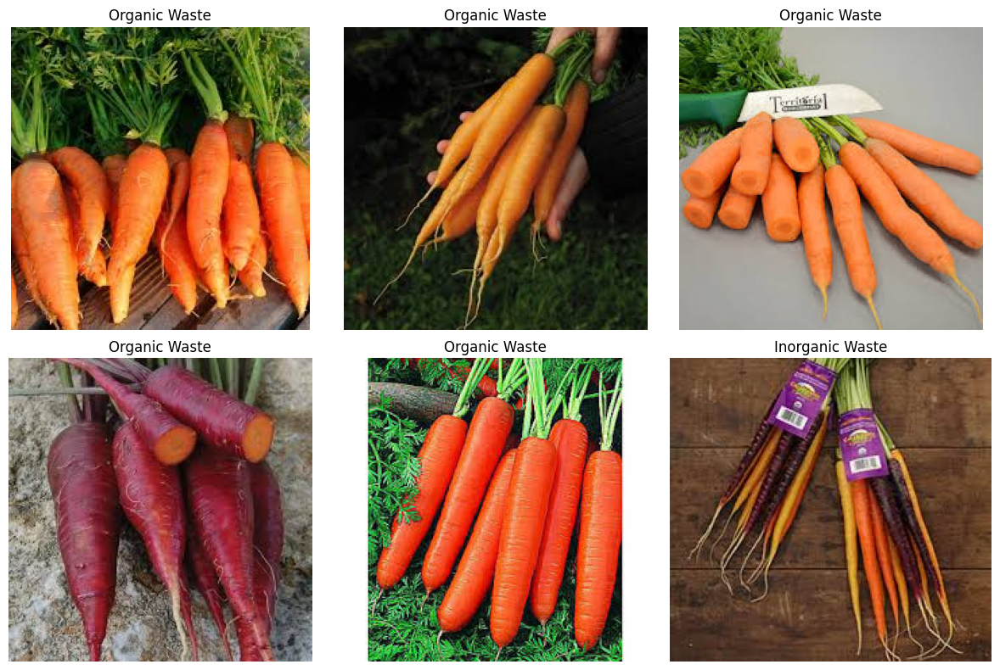

Time process: 0.03841829299926758 s
Time process: 0.03739476203918457 s
Time process: 0.03739166259765625 s
Time process: 0.03737044334411621 s
Time process: 0.03788280487060547 s
Time process: 0.038106441497802734 s


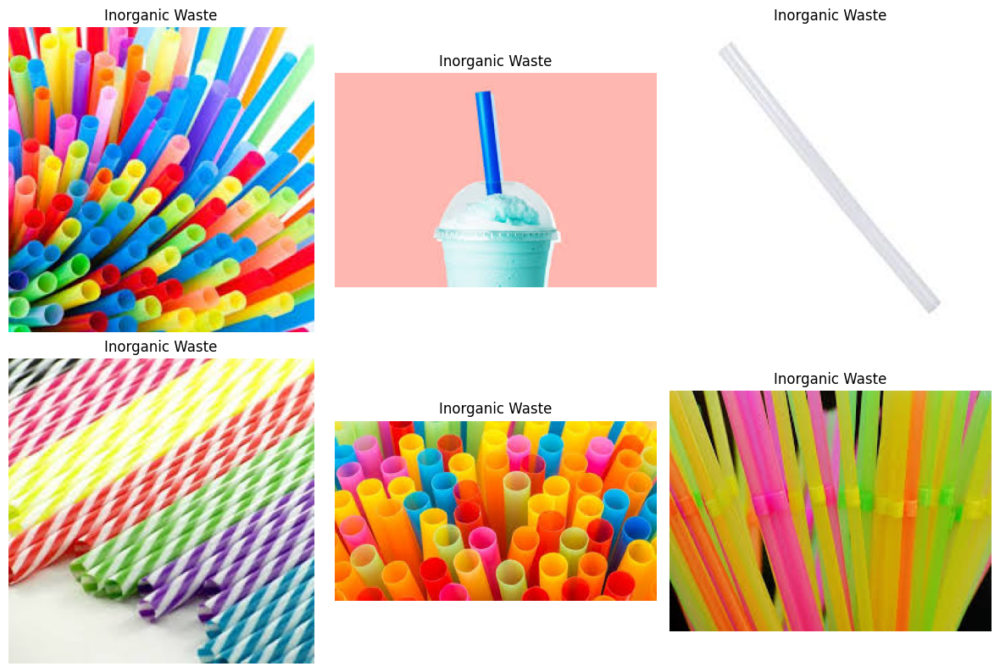

Average processing time per image: 0.03741977214813232 s


In [8]:
import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import os
from pathlib import Path
from torch.utils.data import DataLoader
import torch.nn.functional as F

import warnings
warnings.filterwarnings("ignore", category=UserWarning) 

# Set device to CPU
device = torch.device('cpu')

model_path  = '/kaggle/input/convnext98/tensorflow2/default/1/convnext_rac_model (2).pth'

# Dataset path
train_dir = "/kaggle/input/waste-classification-data/DATASET/TRAIN/"
test_dir = "/kaggle/input/waste-classification-data/DATASET/TEST/"

# Transform dataset
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Create dataset
train_dataset = datasets.ImageFolder(train_dir, transform=transform)
test_dataset = datasets.ImageFolder(test_dir, transform=transform)

# load model
model_loaded = models.convnext_tiny(pretrained=False)
model_loaded.classifier[2] = nn.Linear(model_loaded.classifier[2].in_features, 2)
model_loaded.load_state_dict(torch.load(model_path, map_location='cpu'))  
model_loaded = model_loaded.to(device)
model_loaded.eval()

# predict
def predict_fun(image_path, model):
    image = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])(Image.open(image_path).convert('RGB'))

    image = image.unsqueeze(0).to(device)
    with torch.no_grad():
        output = model(image)
        probs = F.softmax(output, dim=1)
        pred_class = torch.argmax(probs, dim=1).item()
        class_name = train_dataset.classes[pred_class]
        confidence = probs[0][pred_class].item()
    if class_name == 'R':
        return 'Inorganic Waste'
    if class_name == 'O':
        return 'Organic Waste'
   



fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()

all_time = 0  # Initialize timer variable

for i in range(6):
    # Sample image path
    img_path = f'/kaggle/input/waste-classification-data/DATASET/TEST/O/O_{12568 + i}.jpg'
    start = time.time()
    prediction = predict_fun(img_path, model_loaded)
    end = time.time()
    time_process = end - start
    if i!=0:
        all_time += time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  

plt.tight_layout()
plt.show()


fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()

for i in range(6):
    img_path = f'/kaggle/input/waste-classification-data/DATASET/TEST/R/R_{10400 + i}.jpg'
    start = time.time()
    prediction = predict_fun(img_path, model_loaded)
    end = time.time()
    time_process = end - start
    if i!=0:
        all_time += time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print(f"Average processing time per image: {all_time/10} s")


# 3.VGG16

## 1. VGG16 build model

Found 18052 images belonging to 2 classes.
Found 4512 images belonging to 2 classes.
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_3 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 25088)               │         100,352 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1024)                │      25,691,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_15 (Activation)           │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_7 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 1024)                │       1,049,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_17               │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_16 (Activation)           │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_8 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │           1,025 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 41,564,993 (158.56 MB)

 Trainable params: 26,796,033 (102.22 MB)

 Non-trainable params: 14,768,960 (56.34 MB)

Epoch 1/5


2025-06-29 06:03:57.691925: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng11{k2=1,k3=0} for conv (f32[128,64,224,224]{3,2,1,0}, u8[0]{0}) custom-call(f32[128,64,224,224]{3,2,1,0}, f32[64,64,3,3]{3,2,1,0}, f32[64]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_schedule":false,"operation_queue_id":"0","wait_on_operation_queues":[]} is taking a while...
2025-06-29 06:03:57.940765: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.248940066s
Trying algorithm eng11{k2=1,k3=0} for conv (f32[128,64,224,224]{3,2,1,0}, u8[0]{0}) custom-call(f32[128,64,224,224]{3,2,1,0}, f32[64,64,3,3]{3,2,1,0}, f32[64]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivat

142/142 ━━━━━━━━━━━━━━━━━━━━ 300s 2s/step - accuracy: 0.8300 - loss: 0.4425 - val_accuracy: 0.8819 - val_loss: 0.2793
Epoch 2/5
142/142 ━━━━━━━━━━━━━━━━━━━━ 256s 2s/step - accuracy: 0.8919 - loss: 0.2666 - val_accuracy: 0.8701 - val_loss: 0.3153
Epoch 3/5
142/142 ━━━━━━━━━━━━━━━━━━━━ 250s 2s/step - accuracy: 0.9046 - loss: 0.2405 - val_accuracy: 0.8987 - val_loss: 0.2617
Epoch 4/5
142/142 ━━━━━━━━━━━━━━━━━━━━ 249s 2s/step - accuracy: 0.9133 - loss: 0.2166 - val_accuracy: 0.8932 - val_loss: 0.2956
Epoch 5/5
142/142 ━━━━━━━━━━━━━━━━━━━━ 246s 2s/step - accuracy: 0.9153 - loss: 0.2111 - val_accuracy: 0.8810 - val_loss: 0.2883


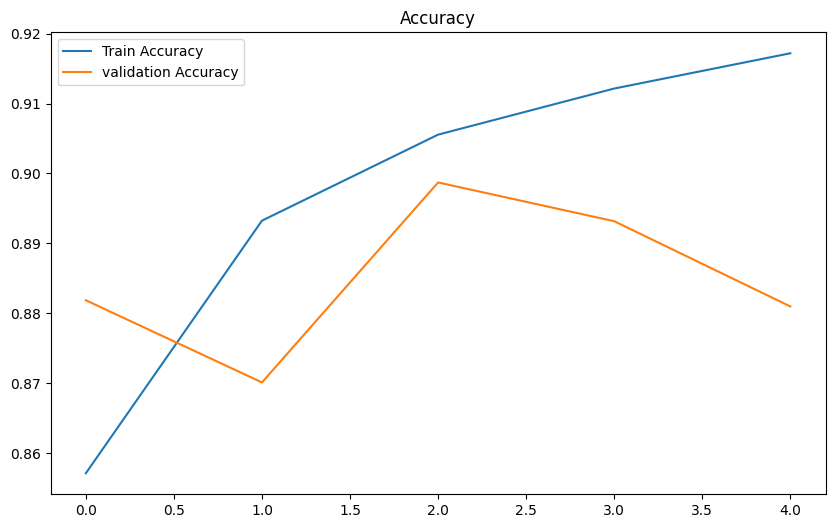

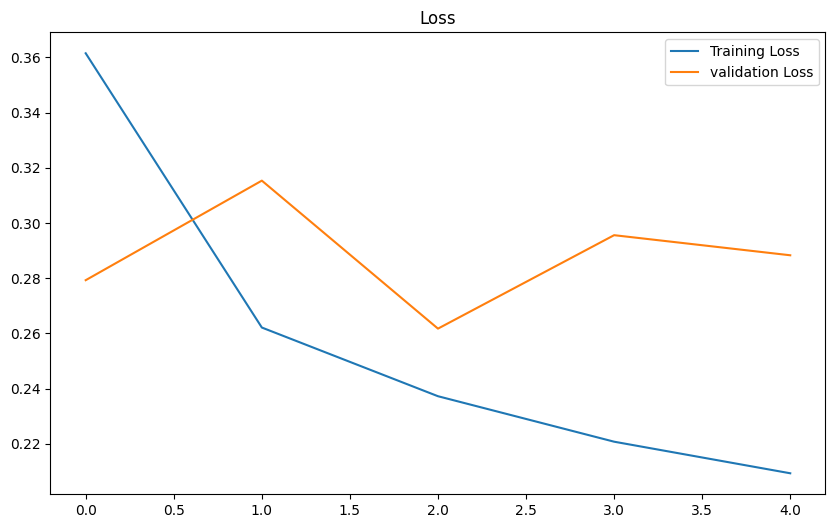

Found 2513 images belonging to 2 classes.
20/20 ━━━━━━━━━━━━━━━━━━━━ 34s 2s/step - accuracy: 0.8764 - loss: 0.3327 


In [18]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt 
import skimage.io
import tensorflow 
import tqdm
import glob

from tqdm import tqdm 

from skimage.io import imread, imshow
from skimage.transform import resize

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import InputLayer, Dense, Flatten, BatchNormalization, Dropout, Activation
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array

%matplotlib inline

# Define paths
train_dir = "/kaggle/input/waste-classification-data/DATASET/TRAIN"
test_dir = "/kaggle/input/waste-classification-data/DATASET/TEST"

train_datagen = ImageDataGenerator(rescale = 1.0 / 255.0,
                                   zoom_range = 0.4,
                                   rotation_range = 10,
                                   horizontal_flip = True,
                                   vertical_flip = True,
                                   validation_split = 0.2)

valid_datagen = ImageDataGenerator(rescale = 1.0 / 255.0,
                                   validation_split = 0.2)

test_datagen  = ImageDataGenerator(rescale = 1.0 / 255.0)

train_dataset  = train_datagen.flow_from_directory(directory = '/kaggle/input/waste-classification-data/DATASET/TRAIN',
                                                   target_size = (224,224),
                                                   class_mode = 'binary',
                                                   batch_size = 128, 
                                                   subset = 'training')

valid_dataset = valid_datagen.flow_from_directory(directory = '/kaggle/input/waste-classification-data/DATASET/TRAIN',
                                                  target_size = (224,224),
                                                  class_mode = 'binary',
                                                  batch_size = 128, 
                                                  subset = 'validation')
train_dataset.class_indices



# Defining Model

base_model = VGG16(input_shape=(224,224,3), 
                   include_top=False,
                   weights="imagenet")


# Freezing Layers 

for layer in base_model.layers:
    layer.trainable=False

base_model.summary()


# Defining Layers

model=Sequential()
model.add(base_model)
model.add(Dropout(0.2))
model.add(Flatten())
model.add(BatchNormalization())
model.add(Dense(1024,kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.2))
model.add(Dense(1024,kernel_initializer='he_uniform'))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.2))
model.add(Dense(1,activation='sigmoid'))


model.summary()

# Model Compile 
model.compile(optimizer='rmsprop',
              loss='binary_crossentropy',
              metrics=['accuracy'])
# Defining Callbacks

filepath = 'vgg16_O_R_classifier.h5'
earlystopping = EarlyStopping(monitor = 'val_auc', 
                              mode = 'max' , 
                              patience = 5,
                              verbose = 1)
checkpoint    = ModelCheckpoint(filepath, 
                                monitor = 'val_auc', 
                                mode='max', 
                                save_best_only=True, 
                                verbose = 1)
callback_list = [earlystopping, checkpoint]

# Model Fitting 
model_history=model.fit(train_dataset,
                        validation_data=valid_dataset,
                        epochs = 5,
                        callbacks = callback_list,
                        verbose = 1)

# Summarize the model loss
plt.figure(figsize=(10,6))
plt.title('Accuracy')
plt.plot(model_history.history['accuracy'], label='Train Accuracy')
plt.plot(model_history.history['val_accuracy'], label='validation Accuracy')
plt.legend()
plt.show()

plt.figure(figsize=(10,6))
plt.title('Loss')
plt.plot(model_history.history['loss'], label='Training Loss')
plt.plot(model_history.history['val_loss'], label='validation Loss')
plt.legend()
plt.show()


# Test Data 
test_data = test_datagen.flow_from_directory(directory = '/kaggle/input/waste-classification-data/DATASET/TEST',
                                             target_size = (224,224),
                                             class_mode = 'binary',
                                             batch_size = 128)

# Evaluating Loss and AUC - Test Data 
model.evaluate(test_data)
model.save('vgg16_O_R_classifier.keras')

## 2. VGG16 Evaluation

In [20]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Load model
model = load_model('/kaggle/input/vgg_model/tensorflow2/default/1/vgg16_O_R_classifier.keras')

# Thư mục chứa dữ liệu test
folder_O = '/kaggle/input/waste-classification-data/DATASET/TEST/O'
folder_R = '/kaggle/input/waste-classification-data/DATASET/TEST/R'

# Hàm image
def load_y_test(folder, label):
    y_test = []
    y_pred = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        if img_path is not None:
            # Resize 224x224
            prediction = predict_fun(img_path)
            y_test.append(label)
            y_pred.append(prediction)
    return y_test, y_pred
    
def predict_fun(img_path):
    # load image
    img = load_img(img_path, target_size=(224, 224))
    x = img_to_array(img)
    x = x / 255.0  
    x = np.expand_dims(x, axis=0)  # add batch size
    
    # Predict
    prediction = model.predict(x, verbose=None)
    
    
    if prediction[0][0] >= 0.5:
        return 1
    else:
        return 0
        

        
y_test_0, y_pred_0 =  load_y_test(folder_O, 0)
y_test_1, y_pred_1 =  load_y_test(folder_R, 1)

y_test = np.array(y_test_0 + y_test_1)
y_pred = np.array(y_pred_0 + y_pred_1)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# confusion matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

# report
report = classification_report(y_test, y_pred, target_names=['Inorganic', 'Organic'])
print('Classification Report:')
print(report)

Accuracy: 0.87
Confusion Matrix:
[[1303   98]
 [ 224  888]]
Classification Report:
              precision    recall  f1-score   support

   Inorganic       0.85      0.93      0.89      1401
     Organic       0.90      0.80      0.85      1112

    accuracy                           0.87      2513
   macro avg       0.88      0.86      0.87      2513
weighted avg       0.87      0.87      0.87      2513



## 3. VGG16 exmaple predict

2025-07-04 13:12:24.207775: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1751634744.524256      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1751634744.612814      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-04 13:12:41.426046: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
I0000 00:00:1751634765.318456      86 service.cc:148] XLA service 0x7e03a400e510 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1751634765.319458      86 service.cc:156]   StreamExecutor device (0): Hos

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
The predicted image is ORGANIC
Time process: 1.7510426044464111 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 362ms/step
The predicted image is ORGANIC
Time process: 0.6935195922851562 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step
The predicted image is ORGANIC
Time process: 0.40854310989379883 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step
The predicted image is ORGANIC
Time process: 0.41744160652160645 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 356ms/step
The predicted image is ORGANIC
Time process: 0.6936159133911133 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 375ms/step
The predicted image is INORGANIC
Time process: 0.43335890769958496 s


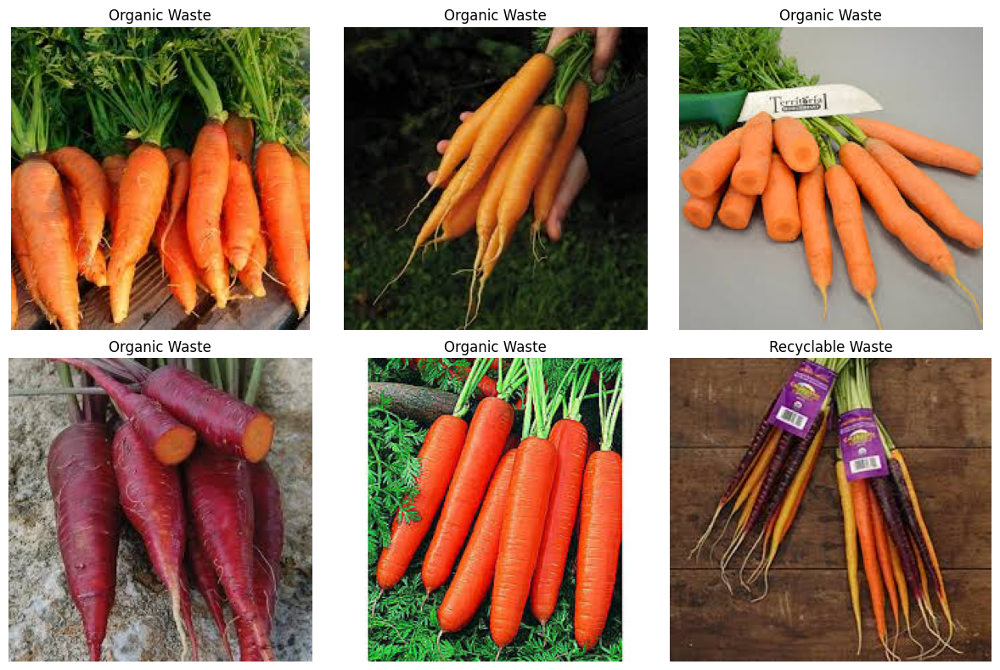

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 360ms/step
The predicted image is ORGANIC
Time process: 0.44085121154785156 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step
The predicted image is INORGANIC
Time process: 0.7078213691711426 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step
The predicted image is INORGANIC
Time process: 0.41288256645202637 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 345ms/step
The predicted image is ORGANIC
Time process: 0.40705442428588867 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step
The predicted image is ORGANIC
Time process: 0.6919448375701904 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 350ms/step
The predicted image is ORGANIC
Time process: 0.4082317352294922 s


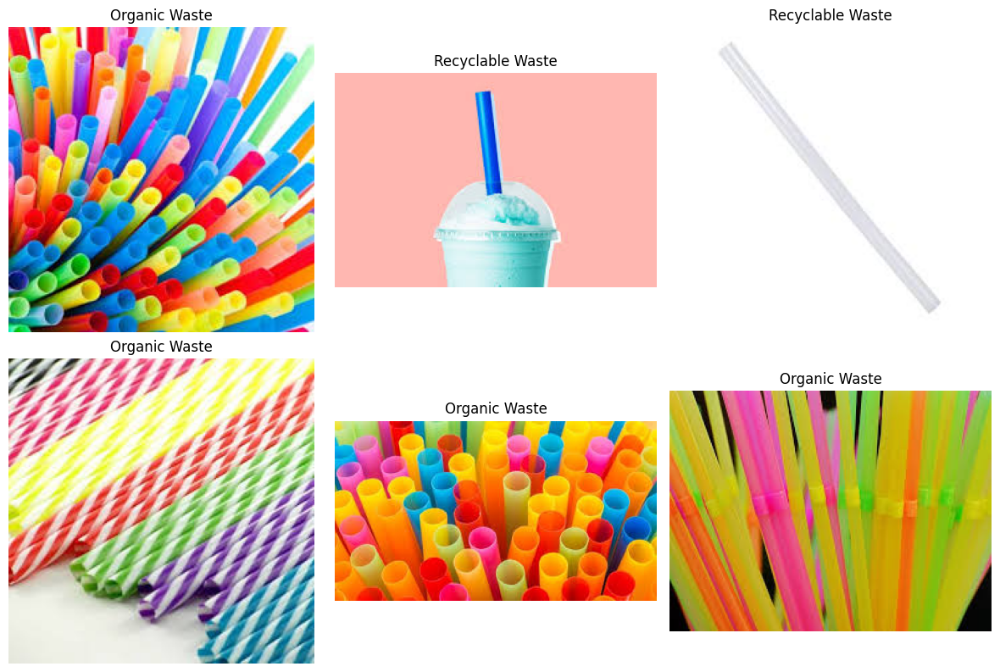

Average processing time per image: 0.52744140625 s


In [1]:
import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 

model = load_model('/kaggle/input/vgg_model/tensorflow2/default/1/vgg16_O_R_classifier.keras')


def predict_fun(img_path):
    # Upload and process images
    img = load_img(img_path, target_size=(224, 224))
    x = img_to_array(img)
    x = x / 255.0  # Apply the same rescale step
    x = np.expand_dims(x, axis=0)  # Add batch size
    
    # Predict
    prediction = model.predict(x)
    
    # Class determination based on threshold 0.5
    if prediction[0][0] >= 0.5:
        print("The predicted image is INORGANIC")
        return 'Recyclable Waste'
    else:
        print("The predicted image is ORGANIC")
        return 'Organic Waste'




fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # Convert to 1D for easier handling
all_time = 0

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_' + str(12568+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i != 0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    #image2 = 'DATASET/TEST/R/R_' + str(10000+i) + '.jpg'
    #result = predict_image(img_path)
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  



plt.tight_layout()
plt.show()


fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # Convert to 1D for easier handling

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_' + str(10400+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i != 0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  

plt.tight_layout()
plt.show()


print(f"Average processing time per image: {all_time/10} s")

# 4. MobileNetV2

## 4.1. MobileNetV2 Build Model

Found 22564 images belonging to 2 classes.
Found 2513 images belonging to 2 classes.
Epoch 1/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 117s 153ms/step - accuracy: 0.6971 - loss: 0.5839 - val_accuracy: 0.9012 - val_loss: 0.2564
Epoch 2/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 90s 128ms/step - accuracy: 0.8982 - loss: 0.2612 - val_accuracy: 0.9185 - val_loss: 0.2138
Epoch 3/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 99s 140ms/step - accuracy: 0.9145 - loss: 0.2243 - val_accuracy: 0.9260 - val_loss: 0.1966
Epoch 4/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 88s 125ms/step - accuracy: 0.9196 - loss: 0.2084 - val_accuracy: 0.9292 - val_loss: 0.1856
Epoch 5/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 92s 130ms/step - accuracy: 0.9233 - loss: 0.2045 - val_accuracy: 0.9325 - val_loss: 0.1779
Epoch 6/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 88s 125ms/step - accuracy: 0.9222 - loss: 0.2001 - val_accuracy: 0.9345 - val_loss: 0.1724
Epoch 7/10
706/706 ━━━━━━━━━━━━━━━━━━━━ 85s 120ms/step - accuracy: 0.9262 - loss: 0.1911 - val_accuracy: 0.9367 - val_loss: 0.16

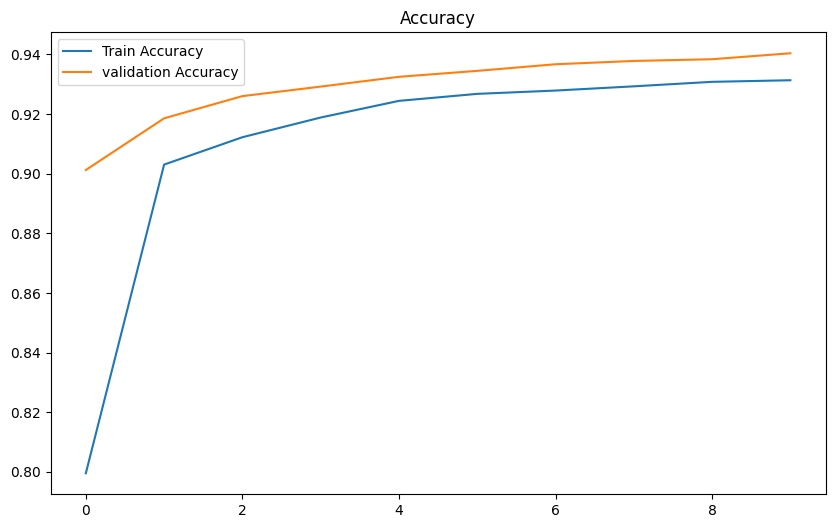

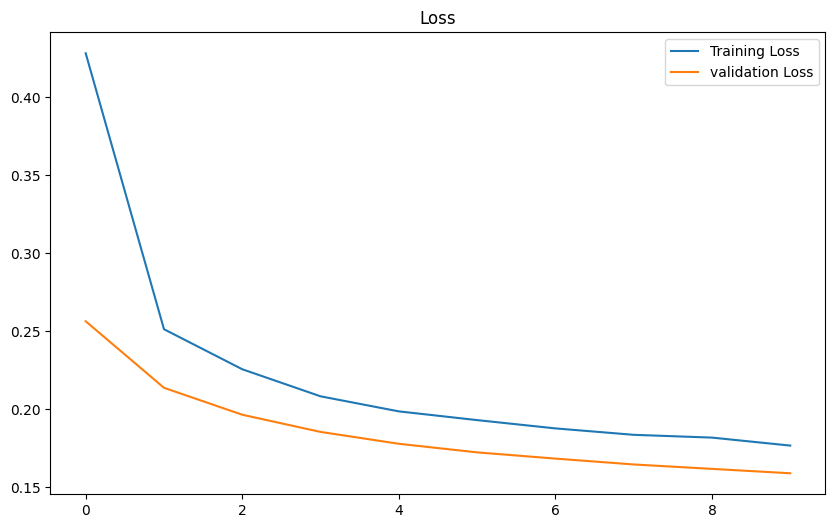

In [24]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import numpy as np
import matplotlib.pyplot as plt

# set parameters
img_size = 224
batch_size = 32
num_classes = 2
epochs = 10

train_path = "/kaggle/input/waste-classification-data/DATASET/TRAIN/"
test_path = "/kaggle/input/waste-classification-data/DATASET/TEST/"

train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)

train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size = (224 , 224),
    batch_size = batch_size,
    color_mode="rgb",
    class_mode = "categorical"
)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size = (224 , 224),
    batch_size = batch_size,
    color_mode="rgb",
    class_mode = "categorical"
)


# create MobileNetV2 model
base_model = MobileNetV2(
    weights='imagenet', 
    include_top=False, 
    input_shape=(img_size, img_size, 3)
)


for layer in base_model.layers:
    layer.trainable = False


x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.2)(x)
predictions = Dense(num_classes, activation='softmax')(x)

# build model
model = Model(inputs=base_model.input, outputs=predictions)

# Compile model
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Huấn luyện mô hình
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=train_generator
)


plt.figure(figsize=(10,6))
plt.title('Accuracy')
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='validation Accuracy')
plt.legend()
plt.show()


plt.figure(figsize=(10,6))
plt.title('Loss')
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='validation Loss')
plt.legend()
plt.show()


for layer in base_model.layers:
    layer.trainable = True

model.save('my_model_mobilenetv2.h5')
#new_model = tf.keras.models.load_model('/kaggle/mobilenet/my_model_mobilenetv2.h5')

## 4.2. MobileNetV2 evaluation

In [25]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


# Load model
model = load_model('/kaggle/input/mobilenetv2/tensorflow2/default/1/my_model_mobilenetv2.h5')

# test folders
folder_O = '/kaggle/input/waste-classification-data/DATASET/TEST/O'
folder_R = '/kaggle/input/waste-classification-data/DATASET/TEST/R'

# load image
def load_y_test(folder, label):
    y_test = []
    y_pred = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path)
        if img is not None:
            # Resize  224x224
            prediction = predict_fun(img)
            y_test.append(label)
            y_pred.append(prediction)
    return y_test, y_pred
    

def predict_fun(img):
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize image (224x224)
    resized_img = cv2.resize(image_rgb, (224, 224))
    # Convert float32
    resized_img = resized_img.astype('float32') / 255.0  # Mô hình được huấn luyện với dữ liệu chuẩn hóa 0-1
    # add batch dimension
    input_img = np.expand_dims(resized_img, axis=0)
    # predict
    prediction = model.predict(input_img, verbose=None)
    result = np.argmax(prediction)

    
    if result == 0:
        #print('The image is Organic Waste')
        return 0
    elif result == 1:
        #print('The image is Inorganic Waste')
        return 1
        
y_test_0, y_pred_0 =  load_y_test(folder_O, 0)
y_test_1, y_pred_1 =  load_y_test(folder_R, 1)

y_test = np.array(y_test_0 + y_test_1)
y_pred = np.array(y_pred_0 + y_pred_1)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# confusion
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

# report
report = classification_report(y_test, y_pred, target_names=['Vô cơ', 'Hữu cơ'])
print('Classification Report:')
print(report)

Accuracy: 0.90
Confusion Matrix:
[[1357   44]
 [ 207  905]]
Classification Report:
              precision    recall  f1-score   support

       Vô cơ       0.87      0.97      0.92      1401
      Hữu cơ       0.95      0.81      0.88      1112

    accuracy                           0.90      2513
   macro avg       0.91      0.89      0.90      2513
weighted avg       0.91      0.90      0.90      2513



## 4.3. MobileNetV2 predict

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
The predicted image is INORGANIC
Time process: 2.0373644828796387 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
The predicted image is INORGANIC
Time process: 0.12349295616149902 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
The predicted image is INORGANIC
Time process: 0.1264944076538086 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
The predicted image is INORGANIC
Time process: 0.12618112564086914 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
The predicted image is INORGANIC
Time process: 0.12511634826660156 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
The predicted image is INORGANIC
Time process: 0.12648367881774902 s


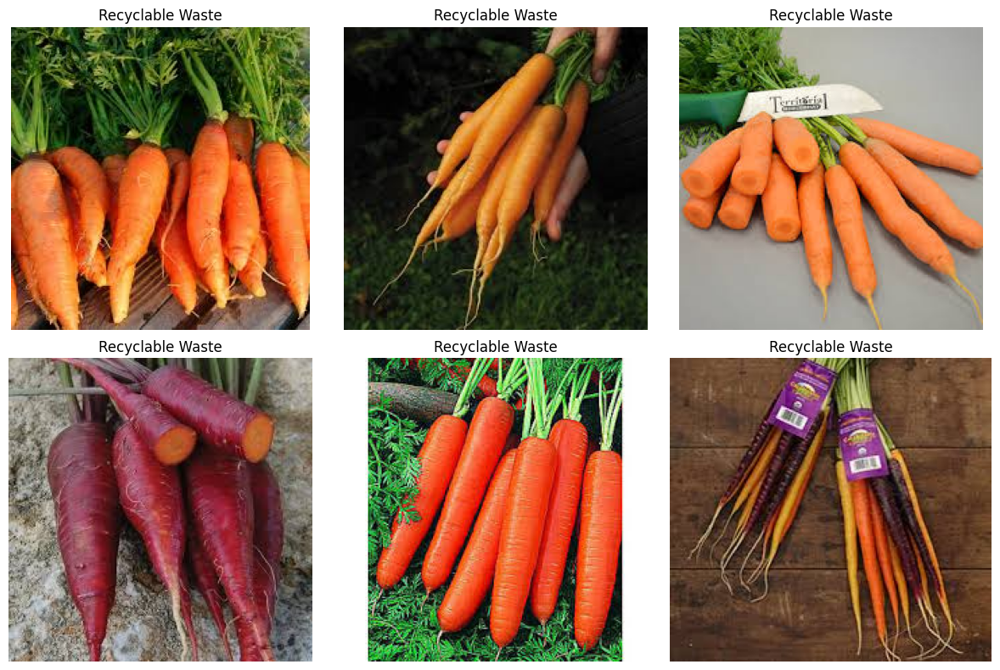

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
The predicted image is ORGANIC
Time process: 0.12294912338256836 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
The predicted image is ORGANIC
Time process: 0.11840438842773438 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
The predicted image is ORGANIC
Time process: 0.11865854263305664 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
The predicted image is INORGANIC
Time process: 0.12098407745361328 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
The predicted image is INORGANIC
Time process: 0.1229097843170166 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
The predicted image is INORGANIC
Time process: 0.1169137954711914 s


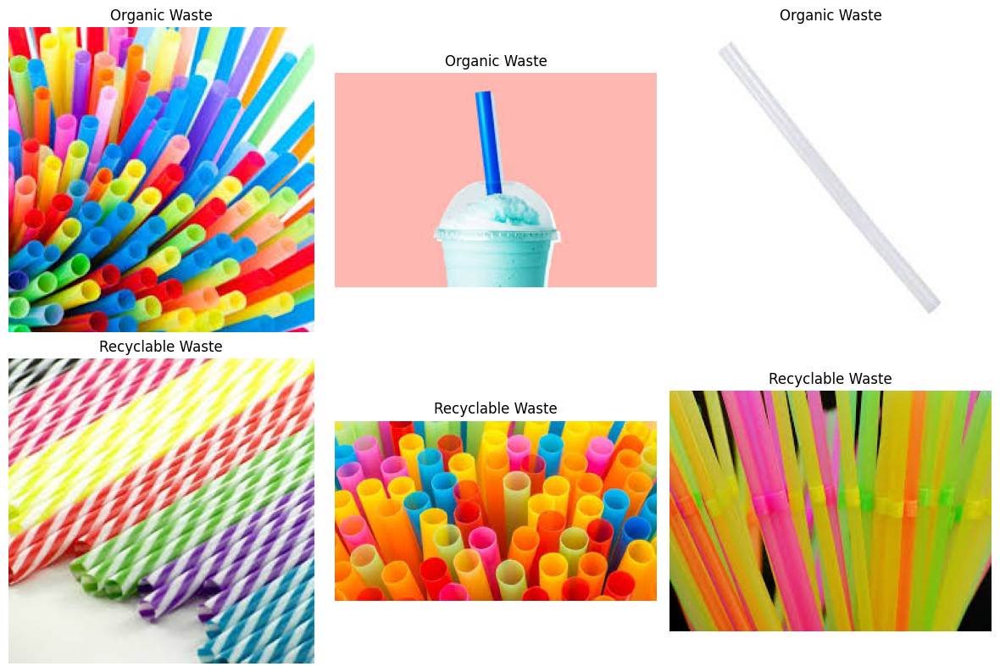

Average processing time per image: 0.12256391048431396 s


In [2]:
import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import warnings
warnings.filterwarnings("ignore", category=UserWarning) 

model = load_model('/kaggle/input/mobilenetv2/tensorflow2/default/1/my_model_mobilenetv2.h5')


def predict_fun(img_path):
    # Upload and process images
    img = load_img(img_path, target_size=(224, 224))
    x = img_to_array(img)
    x = x / 255.0  # Apply same rescale step
    x = np.expand_dims(x, axis=0)  # Add batch size
    
    # Predict
    prediction = model.predict(x)
    
    # Class determination based on threshold 0.5
    if prediction[0][0] >= 0.5:
        print("The predicted image is INORGANIC")
        return 'Recyclable Waste'
    else:
        print("The predicted image is ORGANIC")
        return 'Organic Waste'




fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # Convert to 1D for easier handling
all_time = 0

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_' + str(12568+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i !=0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    #image2 = 'DATASET/TEST/R/R_' + str(10000+i) + '.jpg'
    #result = predict_image(img_path)
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off') 



plt.tight_layout()
plt.show()


fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_' + str(10400+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i !=0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  



plt.tight_layout()
plt.show()




print(f"Average processing time per image: {all_time/10} s")

# 4. RESNET50

## RESNET50 Build Model

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Found 18052 images belonging to 2 classes.
Found 4512 images belonging to 2 classes.


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_11 (Dropout)                 │ (None, 7, 7, 2048)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 100352)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_18               │ (None, 100352)              │         401,408 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 512)                 │      51,380,736 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_19               │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_17 (Activation)           │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_12 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_20               │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_18 (Activation)           │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 75,637,121 (288.53 MB)

 Trainable params: 51,846,657 (197.78 MB)

 Non-trainable params: 23,790,464 (90.75 MB)

Epoch 1/5
142/142 ━━━━━━━━━━━━━━━━━━━━ 281s 2s/step - accuracy: 0.7052 - loss: 0.6069 - val_accuracy: 0.7338 - val_loss: 0.5366
Epoch 2/5
142/142 ━━━━━━━━━━━━━━━━━━━━ 285s 2s/step - accuracy: 0.7638 - loss: 0.5048 - val_accuracy: 0.7699 - val_loss: 0.4979
Epoch 3/5
142/142 ━━━━━━━━━━━━━━━━━━━━ 239s 2s/step - accuracy: 0.7657 - loss: 0.4942 - val_accuracy: 0.7746 - val_loss: 0.4784
Epoch 4/5
142/142 ━━━━━━━━━━━━━━━━━━━━ 231s 2s/step - accuracy: 0.7868 - loss: 0.4625 - val_accuracy: 0.7828 - val_loss: 0.4813
Epoch 5/5
142/142 ━━━━━━━━━━━━━━━━━━━━ 228s 2s/step - accuracy: 0.7779 - loss: 0.4742 - val_accuracy: 0.7611 - val_loss: 0.5062


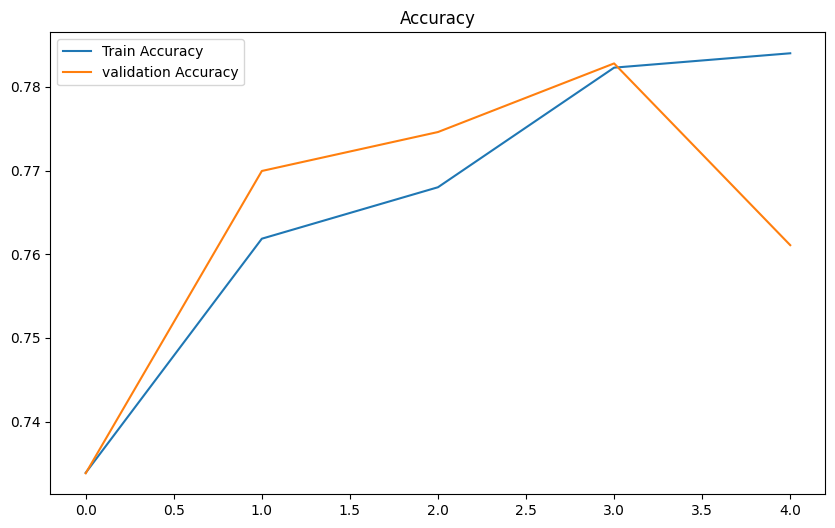

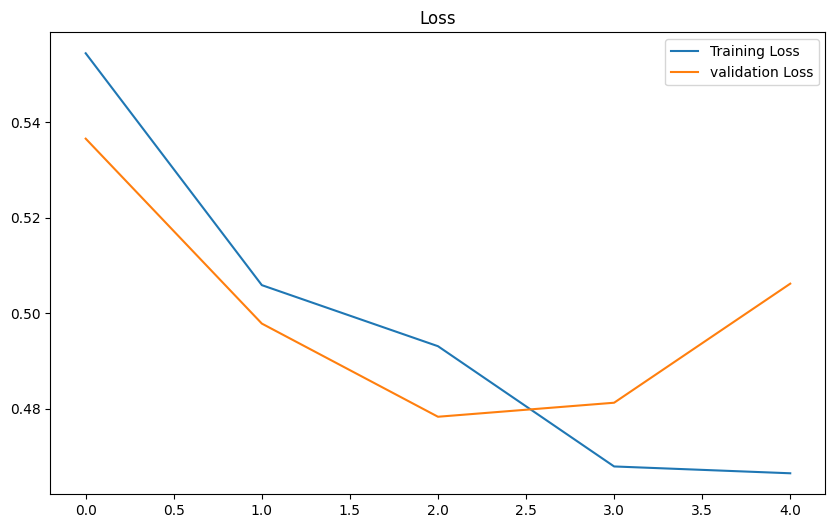

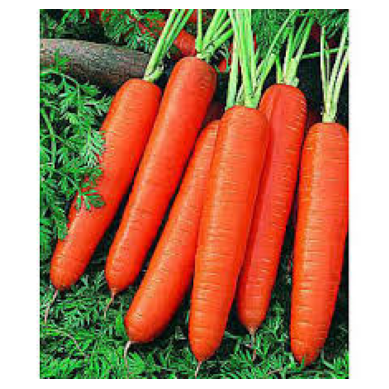

In [27]:
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense, BatchNormalization
import tensorflow as tf
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.models import Sequential

resnet = ResNet50(input_shape=(224,224,3), weights='imagenet', include_top=False)
# Freezing Layers 

for layer in resnet.layers:
    layer.trainable=False

train_datagen = ImageDataGenerator(rescale = 1.0 / 255.0,
                                   zoom_range = 0.4,
                                   rotation_range = 10,
                                   horizontal_flip = True,
                                   vertical_flip = True,
                                   validation_split = 0.2)

valid_datagen = ImageDataGenerator(rescale = 1.0 / 255.0,
                                   validation_split = 0.2)

test_datagen  = ImageDataGenerator(rescale = 1.0 / 255.0)


train_dataset  = train_datagen.flow_from_directory(directory = '/kaggle/input/waste-classification-data/DATASET/TRAIN',
                                                   target_size = (224,224),
                                                   class_mode = 'binary',
                                                   batch_size = 128, 
                                                   subset = 'training')

valid_dataset = valid_datagen.flow_from_directory(directory = '/kaggle/input/waste-classification-data/DATASET/TRAIN',
                                                  target_size = (224,224),
                                                  class_mode = 'binary',
                                                  batch_size = 128, 
                                                  subset = 'validation')
# Defining Layers

model2=Sequential()
model2.add(resnet)
model2.add(Dropout(0.2))
model2.add(Flatten())
model2.add(BatchNormalization())
model2.add(Dense(512,kernel_initializer='he_uniform'))
model2.add(BatchNormalization())
model2.add(Activation('relu'))
model2.add(Dropout(0.2))
model2.add(Dense(512,kernel_initializer='he_uniform'))
model2.add(BatchNormalization())
model2.add(Activation('relu'))
model2.add(Dropout(0.2))
model2.add(Dense(1,activation='sigmoid'))
# Summary

model2.summary()

adam = tf.keras.optimizers.Adam(learning_rate=0.001)

model2.compile(loss='binary_crossentropy',
              metrics=['accuracy'],
              optimizer=adam)

# Defining Callbacks

earlystopping = EarlyStopping(monitor='val_accuracy', 
                              mode='max', 
                              patience=2,
                              verbose=1)


callback_list = [earlystopping]
# Model Fitting 

history = model2.fit(train_dataset,
                          validation_data=valid_dataset,
                          epochs=5,
                          callbacks=callback_list,
                          verbose=1)

plt.figure(figsize=(10,6))
plt.title('Accuracy')
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='validation Accuracy')
plt.legend()
plt.show()


plt.figure(figsize=(10,6))
plt.title('Loss')
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='validation Loss')
plt.legend()
plt.show()

# Load and preprocess the image
img = load_img('/kaggle/input/waste-classification-data/DATASET/TEST/O/O_12572.jpg', target_size=(224, 224))
img_array = img_to_array(img) / 255.0  # Normalize to [0,1]
plt.imshow(img_array)
plt.axis('off')
plt.show()

model.save('my_model_resnet50.h5')

## RESNET50 evalution

In [28]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


# Load model
model = load_model('/kaggle/input/resnet_model/tensorflow2/default/1/my_model_resnet50.h5')

# test folder
folder_O = '/kaggle/input/waste-classification-data/DATASET/TEST/O'
folder_R = '/kaggle/input/waste-classification-data/DATASET/TEST/R'

# load image
def load_y_test(folder, label):
    y_test = []
    y_pred = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path)
        if img is not None:
            # Resize  224x224
            prediction = predict_fun(img)
            y_test.append(label)
            y_pred.append(prediction)
    return y_test, y_pred
    

def predict_fun(img):
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize  (224x224)
    resized_img = cv2.resize(image_rgb, (224, 224))
    # Convert float32
    resized_img = resized_img.astype('float32') / 255.0  # Mô hình được huấn luyện với dữ liệu chuẩn hóa 0-1
    # add batch dimension
    input_img = np.expand_dims(resized_img, axis=0)
    # predict
    prediction = model.predict(input_img, verbose=None)
    result = np.argmax(prediction)

  
    if result == 0:
        #print('The image is Organic Waste')
        return 0
    elif result == 1:
        #print('The image is Inorganic Waste')
        return 1
        
y_test_0, y_pred_0 =  load_y_test(folder_O, 0)
y_test_1, y_pred_1 =  load_y_test(folder_R, 1)

y_test = np.array(y_test_0 + y_test_1)
y_pred = np.array(y_pred_0 + y_pred_1)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# confusion matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

# report
report = classification_report(y_test, y_pred, target_names=['Vô cơ', 'Hữu cơ'])
print('Classification Report:')
print(report)

Accuracy: 0.90
Confusion Matrix:
[[1357   44]
 [ 207  905]]
Classification Report:
              precision    recall  f1-score   support

       Vô cơ       0.87      0.97      0.92      1401
      Hữu cơ       0.95      0.81      0.88      1112

    accuracy                           0.90      2513
   macro avg       0.91      0.89      0.90      2513
weighted avg       0.91      0.90      0.90      2513



## RESNET50 example predict

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
The predicted image is INORGANIC
Time process: 1.5931408405303955 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
The predicted image is INORGANIC
Time process: 0.11949563026428223 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
The predicted image is INORGANIC
Time process: 0.1181037425994873 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
The predicted image is INORGANIC
Time process: 0.11997723579406738 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
The predicted image is INORGANIC
Time process: 0.11889934539794922 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
The predicted image is INORGANIC
Time process: 0.11784505844116211 s


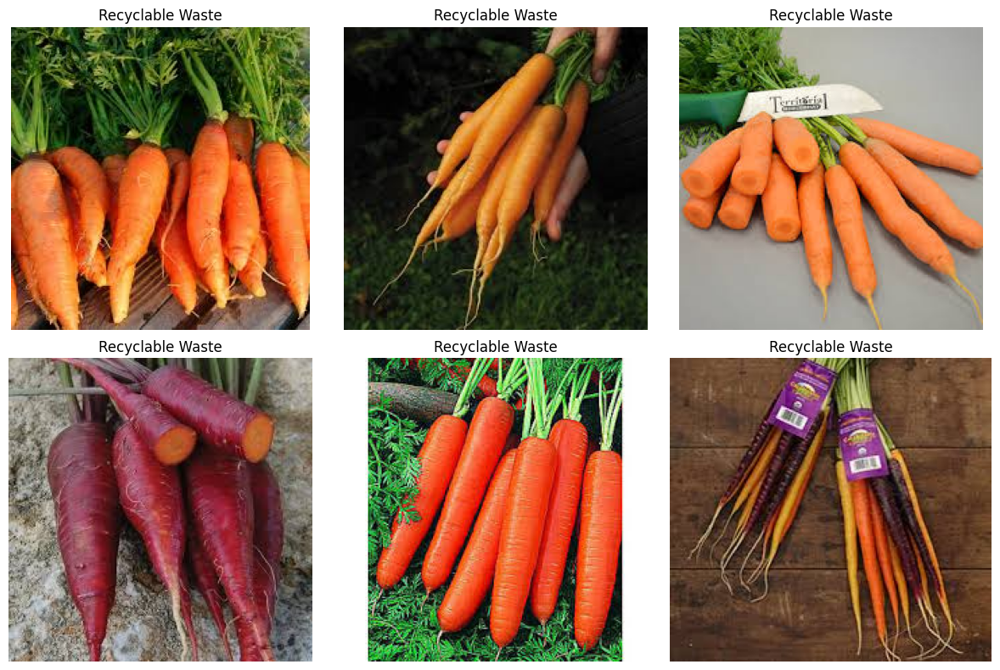

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
The predicted image is ORGANIC
Time process: 0.1155405044555664 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
The predicted image is ORGANIC
Time process: 0.11715912818908691 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
The predicted image is ORGANIC
Time process: 0.11899113655090332 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
The predicted image is INORGANIC
Time process: 0.11706757545471191 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
The predicted image is INORGANIC
Time process: 0.11641144752502441 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
The predicted image is INORGANIC
Time process: 0.11850714683532715 s


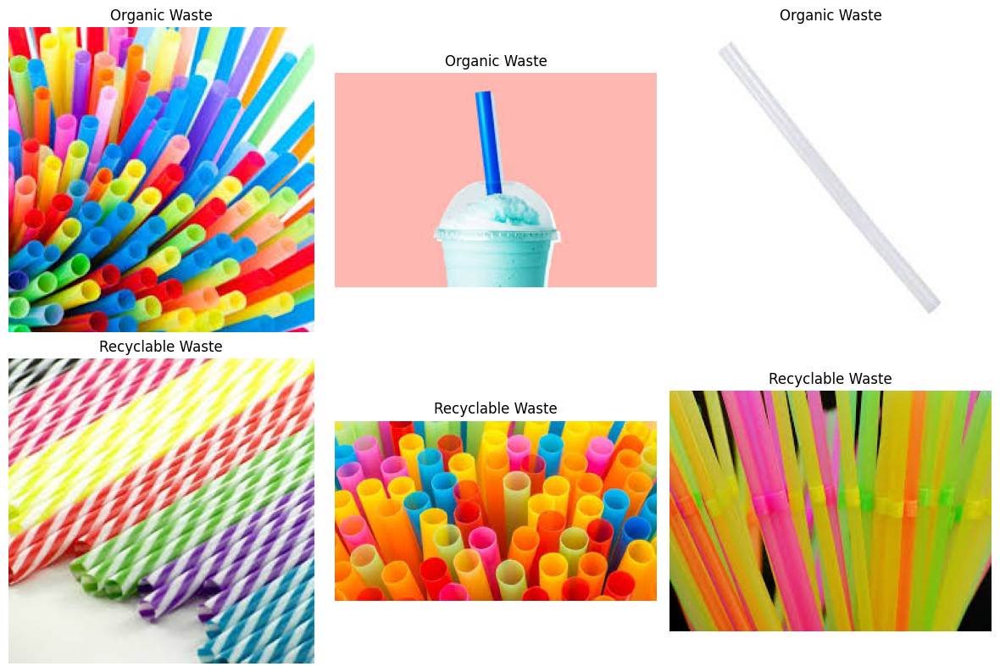

Average processing time per image: 0.11824574470520019 s


In [3]:
import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import warnings
warnings.filterwarnings("ignore", category=UserWarning) 

model = load_model('/kaggle/input/resnet_model/tensorflow2/default/1/my_model_resnet50.h5')


def predict_fun(img_path):
    # Upload and process images
    img = load_img(img_path, target_size=(224, 224))
    x = img_to_array(img)
    x = x / 255.0  # Apply the same rescale step
    x = np.expand_dims(x, axis=0)  # Add batch size
    
    # predict
    prediction = model.predict(x)
    
    # Class determination based on threshold 0.5
    if prediction[0][0] >= 0.5:
        print("The predicted image is INORGANIC")
        return 'Recyclable Waste'
    else:
        print("The predicted image is ORGANIC")
        return 'Organic Waste'




fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # Convert to 1D for easier handling
all_time = 0

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_' + str(12568+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i != 0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    #image2 = 'DATASET/TEST/R/R_' + str(10000+i) + '.jpg'
    #result = predict_image(img_path)
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  



plt.tight_layout()
plt.show()


fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  # Convert to 1D for easier handling

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_' + str(10400+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i != 0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  



plt.tight_layout()
plt.show()




print(f"Average processing time per image: {all_time/10} s")

# EfficientNet

## 1. EfficientNet build Model

Found 22564 files belonging to 2 classes.
Using 18052 files for training.
Found 22564 files belonging to 2 classes.
Using 4512 files for validation.
Found 2513 files belonging to 2 classes.
82420632/82420632 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/5
565/565 ━━━━━━━━━━━━━━━━━━━━ 260s 167ms/step - accuracy: 0.6150 - loss: 0.6491 - val_accuracy: 0.6744 - val_loss: 0.5994
Epoch 2/5
565/565 ━━━━━━━━━━━━━━━━━━━━ 61s 108ms/step - accuracy: 0.6606 - loss: 0.6127 - val_accuracy: 0.6868 - val_loss: 0.5830
Epoch 3/5
565/565 ━━━━━━━━━━━━━━━━━━━━ 60s 106ms/step - accuracy: 0.6713 - loss: 0.5990 - val_accuracy: 0.6941 - val_loss: 0.5775
Epoch 4/5
565/565 ━━━━━━━━━━━━━━━━━━━━ 60s 106ms/step - accuracy: 0.6847 - loss: 0.5873 - val_accuracy: 0.6946 - val_loss: 0.5686
Epoch 5/5
565/565 ━━━━━━━━━━━━━━━━━━━━ 60s 107ms/step - accuracy: 0.6797 - loss: 0.5950 - val_accuracy: 0.6999 - val_loss: 0.5642


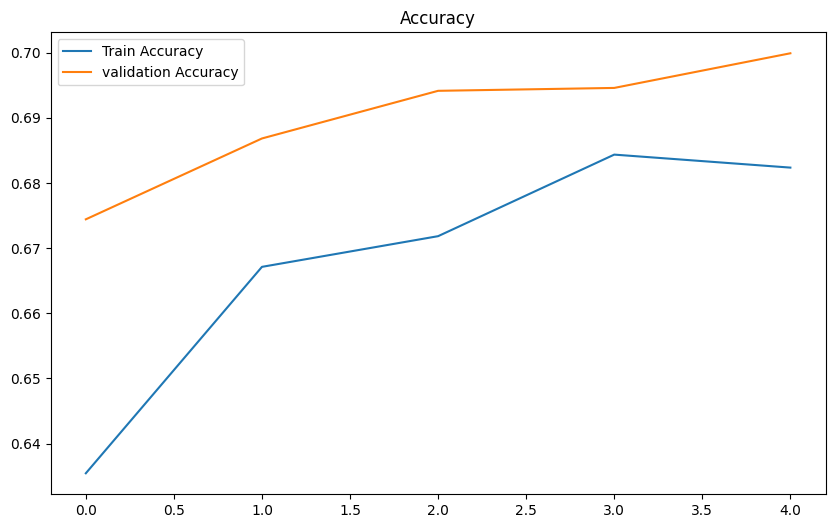

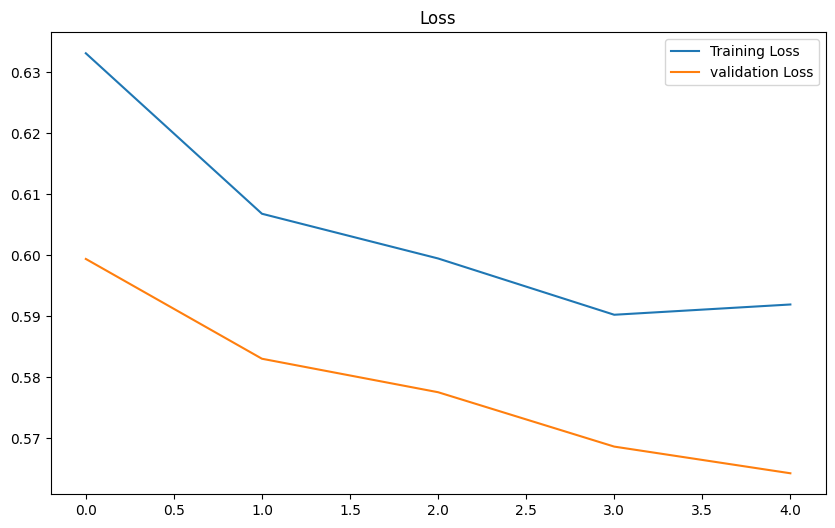

Epoch 5/10


E0000 00:00:1751184231.437244     106 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1751184231.578215     106 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1751184231.968120     106 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1751184232.113515     106 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


565/565 ━━━━━━━━━━━━━━━━━━━━ 436s 459ms/step - accuracy: 0.7826 - loss: 0.5052 - val_accuracy: 0.8994 - val_loss: 0.2550
Epoch 6/10
565/565 ━━━━━━━━━━━━━━━━━━━━ 191s 337ms/step - accuracy: 0.9063 - loss: 0.2403 - val_accuracy: 0.9238 - val_loss: 0.2005
Epoch 7/10
565/565 ━━━━━━━━━━━━━━━━━━━━ 190s 337ms/step - accuracy: 0.9350 - loss: 0.1691 - val_accuracy: 0.9344 - val_loss: 0.1809
Epoch 8/10
565/565 ━━━━━━━━━━━━━━━━━━━━ 190s 337ms/step - accuracy: 0.9499 - loss: 0.1300 - val_accuracy: 0.9384 - val_loss: 0.1690
Epoch 9/10
565/565 ━━━━━━━━━━━━━━━━━━━━ 190s 337ms/step - accuracy: 0.9656 - loss: 0.0975 - val_accuracy: 0.9382 - val_loss: 0.1653
Epoch 10/10
565/565 ━━━━━━━━━━━━━━━━━━━━ 190s 336ms/step - accuracy: 0.9729 - loss: 0.0743 - val_accuracy: 0.9422 - val_loss: 0.1666


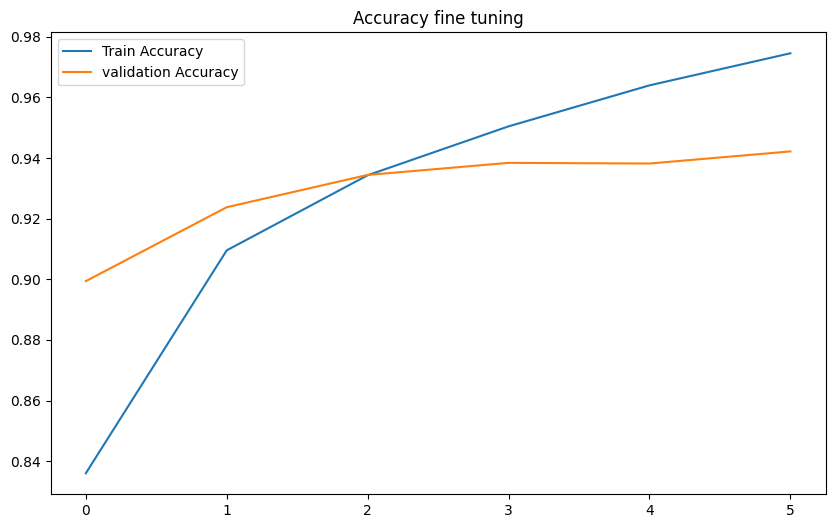

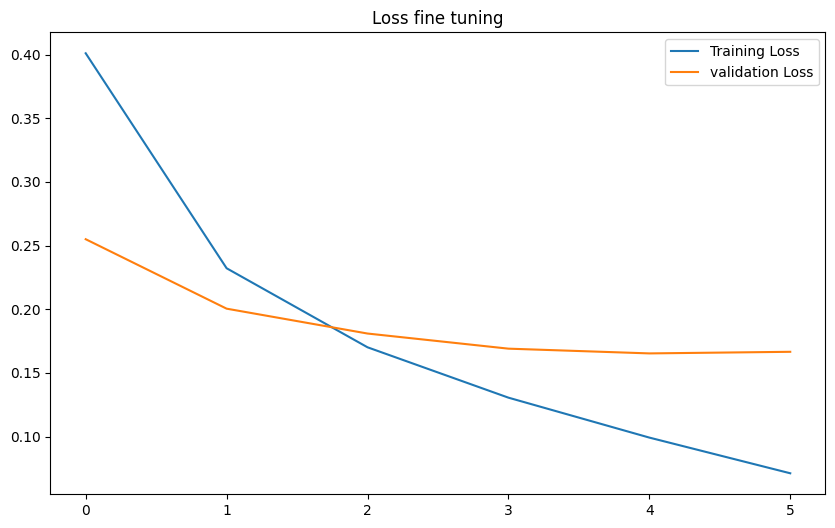

79/79 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - accuracy: 0.9566 - loss: 0.1183
Test accuracy: 0.89


In [30]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications import MobileNetV3Large
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image_dataset_from_directory
import os

# path dataset

train_dir = '/kaggle/input/waste-classification-data/DATASET/TRAIN/'
test_dir = '/kaggle/input/waste-classification-data/DATASET/TEST/'

# parameters
batch_size = 32
img_size = (224, 224)

train_ds = image_dataset_from_directory(
    train_dir,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=img_size,
    batch_size=batch_size
)

val_ds = image_dataset_from_directory(
    train_dir,
    validation_split=0.2,
    subset="validation",
    seed=123,
    image_size=img_size,
    batch_size=batch_size
)

test_ds = image_dataset_from_directory(
    test_dir,
    image_size=img_size,
    batch_size=batch_size,
    shuffle=False
)


data_augmentation = tf.keras.Sequential([
    layers.RandomFlip('horizontal'),
    layers.RandomRotation(0.1),
])

train_ds = train_ds.map(lambda x, y: (data_augmentation(x), y))

# normalization_layer
normalization_layer = layers.Rescaling(1./255)
train_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
val_ds = val_ds.map(lambda x, y: (normalization_layer(x), y))
test_ds = test_ds.map(lambda x, y: (normalization_layer(x), y))

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

# classes
class_names=['Organic' , 'Recyclable']
#class_names = train_ds.class_names
num_classes = len(class_names)

# load EfficientNet-Lite to backbone
base_model = tf.keras.applications.EfficientNetV2S(
    input_shape=img_size + (3,),
    include_top=False,
    weights='imagenet'
)


base_model.trainable = False


model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dropout(0.2),
    layers.Dense(num_classes, activation='softmax')
])

# Compile model
model.compile(
    optimizer=tf.keras.optimizers.Adam(),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# train
epochs = 5
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=epochs
)


plt.figure(figsize=(10,6))
plt.title('Accuracy')
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='validation Accuracy')
plt.legend()
plt.show()


plt.figure(figsize=(10,6))
plt.title('Loss')
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='validation Loss')
plt.legend()
plt.show()


base_model.trainable = True

#  learning rate when fine-tuning
model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# continue to train
fine_tune_epochs = 5
total_epochs = epochs + fine_tune_epochs

history_finetune = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=total_epochs,
    initial_epoch=history.epoch[-1]
)


plt.figure(figsize=(10,6))
plt.title('Accuracy fine tuning')
plt.plot(history_finetune.history['accuracy'], label='Train Accuracy')
plt.plot(history_finetune.history['val_accuracy'], label='validation Accuracy')
plt.legend()
plt.show()


plt.figure(figsize=(10,6))
plt.title('Loss fine tuning')
plt.plot(history_finetune.history['loss'], label='Training Loss')
plt.plot(history_finetune.history['val_loss'], label='validation Loss')
plt.legend()
plt.show()

# save model
test_loss, test_acc = model.evaluate(test_ds)
print(f"Test accuracy: {test_acc:.2f}")
model.save('my_model_effectlite.h5')

## 2. EfficientNet evaluation

In [31]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from tensorflow.keras.models import load_model
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix



model = load_model('/kaggle/input/effectlite_model/tensorflow2/default/1/my_model_effectlite.h5')


folder_O = '/kaggle/input/waste-classification-data/DATASET/TEST/O'
folder_R = '/kaggle/input/waste-classification-data/DATASET/TEST/R'


def load_y_test(folder, label):
    y_test = []
    y_pred = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path)
        if img is not None:
            # Resize  224x224
            prediction = predict_fun(img)
            y_test.append(label)
            y_pred.append(prediction)
    return y_test, y_pred
    

def predict_fun(img):
    image_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # Resize (224x224)
    resized_img = cv2.resize(image_rgb, (224, 224))
    # Cconvert float32
    resized_img = resized_img.astype('float32') / 255.0  # Mô hình được huấn luyện với dữ liệu chuẩn hóa 0-1
    # add batch dimension
    input_img = np.expand_dims(resized_img, axis=0)
    # predict
    prediction = model.predict(input_img, verbose=None)
    result = np.argmax(prediction)

    
    if result == 0:
        #print('The image is Organic Waste')
        return 0
    elif result == 1:
        #print('The image is Inorganic Waste')
        return 1
        
y_test_0, y_pred_0 =  load_y_test(folder_O, 0)
y_test_1, y_pred_1 =  load_y_test(folder_R, 1)

y_test = np.array(y_test_0 + y_test_1)
y_pred = np.array(y_pred_0 + y_pred_1)

accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy:.2f}')

# confusion matrix
cm = confusion_matrix(y_test, y_pred)
print('Confusion Matrix:')
print(cm)

# report
report = classification_report(y_test, y_pred, target_names=['Inorganic', 'organic'])
print('Classification Report:')
print(report)

Accuracy: 0.89
Confusion Matrix:
[[1369   32]
 [ 244  868]]
Classification Report:
              precision    recall  f1-score   support

   Inorganic       0.85      0.98      0.91      1401
     organic       0.96      0.78      0.86      1112

    accuracy                           0.89      2513
   macro avg       0.91      0.88      0.89      2513
weighted avg       0.90      0.89      0.89      2513



## 3. EfficientNet example predict

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
The predicted image is INORGANIC
Time process: 6.170793056488037 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
The predicted image is INORGANIC
Time process: 0.2149367332458496 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
The predicted image is INORGANIC
Time process: 0.20987582206726074 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
The predicted image is INORGANIC
Time process: 0.21071457862854004 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
The predicted image is INORGANIC
Time process: 0.2100226879119873 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
The predicted image is ORGANIC
Time process: 0.20845508575439453 s


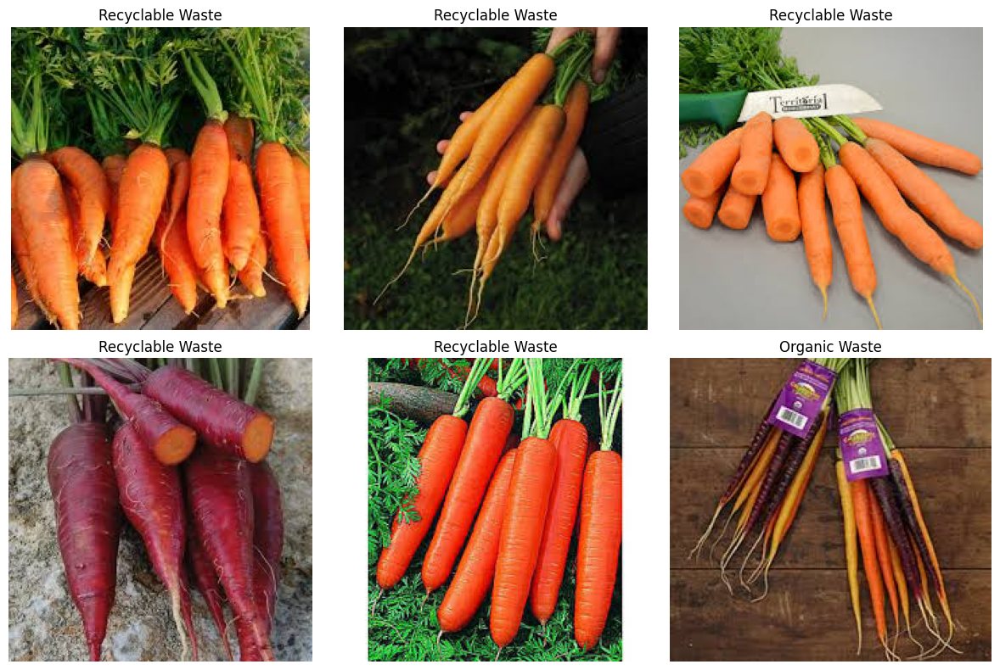

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
The predicted image is ORGANIC
Time process: 0.20409846305847168 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
The predicted image is ORGANIC
Time process: 0.20902252197265625 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
The predicted image is ORGANIC
Time process: 0.2015068531036377 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
The predicted image is INORGANIC
Time process: 0.20134997367858887 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
The predicted image is INORGANIC
Time process: 0.2095651626586914 s
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
The predicted image is ORGANIC
Time process: 0.21104025840759277 s


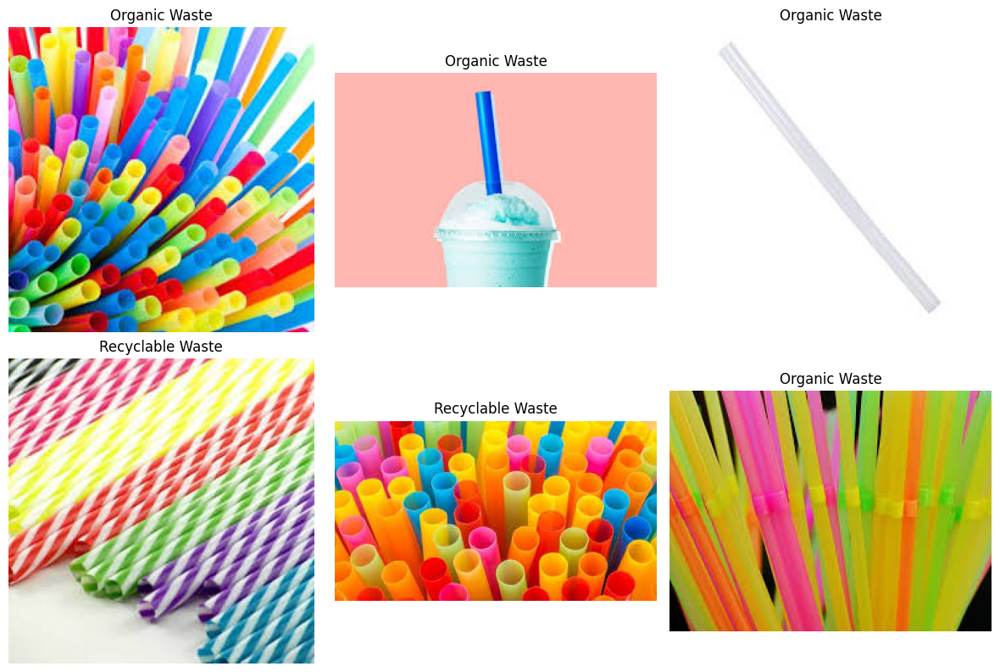

Average processing time per image: 0.2086489677429199 s


In [4]:
import os
os.environ['TF_ENABLE_ONEDNN_OPTS'] = '0'
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import time
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array

import warnings
warnings.filterwarnings("ignore", category=UserWarning) 

model = load_model('/kaggle/input/effectlite_model/tensorflow2/default/1/my_model_effectlite.h5')


def predict_fun(img_path):
    # Upload and process images
    img = load_img(img_path, target_size=(224, 224))
    x = img_to_array(img)
    x = x / 255.0  # Apply the same rescale step
    x = np.expand_dims(x, axis=0)  # Add batch size
    
    # Predict
    prediction = model.predict(x)
    
    # Class determination based on threshold 0.5
    if prediction[0][0] >= 0.5:
        print("The predicted image is INORGANIC")
        return 'Recyclable Waste'
    else:
        print("The predicted image is ORGANIC")
        return 'Organic Waste'




fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  
all_time = 0

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_' + str(12568+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i!=0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    #image2 = 'DATASET/TEST/R/R_' + str(10000+i) + '.jpg'
    #result = predict_image(img_path)
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')



plt.tight_layout()
plt.show()


fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.flatten()  

for i in range(6):
    # Create figure to display
    img_path = '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_' + str(10400+i) + '.jpg'
    start = time.time()
    prediction = predict_fun(img_path)
    end = time.time()
    time_process = end - start
    if i!=0:
        all_time+= time_process
    print(f"Time process: {time_process} s")
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(prediction)
    axes[i].axis('off')  



plt.tight_layout()
plt.show()




print(f"Average processing time per image: {all_time/10} s")

# 6. Evaluation models.

## 6.1 Confusion Matrix

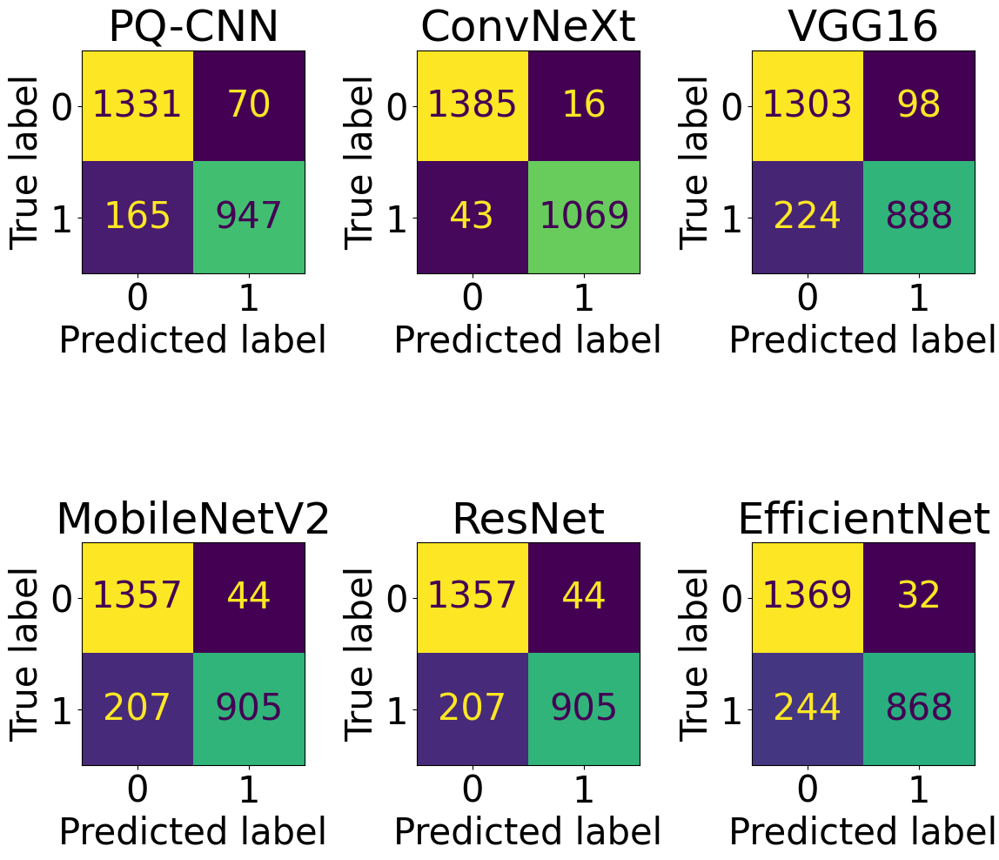

In [8]:
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay
import numpy as np

# Define the confusion matrices
cmats = [
    np.array([[1331, 70], 
              [165, 947]]),   # CNN
    np.array([[1385, 16],
              [43, 1069]]), #ConvNext
    np.array([[1303, 98],
              [224, 888]]), #VGG16
    np.array([[1357, 44],
              [207, 905]]), #MobileNetV2
    np.array([[1357, 44],
              [207, 905]]), #RESNet
    np.array([[1369, 32],
              [244, 868]]) #EffectLiteNet
]

# Create a 3x2 grid for subplots
fig, axes = plt.subplots(2, 3, figsize=(12, 12))
axes = axes.flatten()  # Flatten to easily iterate

# Plot each confusion matrix
for i, cm in enumerate(cmats):
    disp = ConfusionMatrixDisplay(cm)
    
    disp.plot(ax=axes[i], colorbar=False)
    
    if i== 0:
        axes[i].set_title(f'PQ-CNN')
    if i== 1:
        axes[i].set_title(f'ConvNeXt')
    if i== 2:
        axes[i].set_title(f'VGG16')
    if i== 3:
        axes[i].set_title(f'MobileNetV2')
    if i== 4:
        axes[i].set_title(f'ResNet')
    if i== 5:
        axes[i].set_title(f'EfficientNet')

# Remove the unused subplot (since only 5 matrices for 6 subplots)
#fig.delaxes(axes[-1])  # delete the last subplot
plt.rcParams["figure.figsize"] = (20,3)
plt.rcParams.update({'font.size': 30})
plt.tight_layout()
plt.savefig('bieu_do_confusion.png')  
plt.show()


## 6.2. Compare models

In [10]:
import numpy as np

# Ma trận nhầm lẫn của các mô hình
cmats = [
    np.array([[1331, 70], 
              [165, 947]]),   # CNN
    np.array([[1385, 16],
              [43, 1069]]), #ConvNext
    np.array([[1303, 98],
              [224, 888]]), #VGG16
    np.array([[1357, 44],
              [207, 905]]), #MobileNetV2
    np.array([[1357, 44],
              [207, 905]]), #RESNet
    np.array([[1369, 32],
              [244, 868]]) #EffectLiteNet
]

def tinh_mdr_fdr(cmats):
    results = []
    for idx, cm in enumerate(cmats):
        total = np.sum(cm)
        sai = np.sum(cm) - np.trace(cm)
        false_positive = cm[0,1]  # Dự đoán sai là false positive
        total_sai = sai
        total_fp = false_positive

        # Tính MDR
        mdr = sai / total if total > 0 else 0

        # Tính FDR
        fdr = false_positive / sai if sai > 0 else 0

        results.append({
            'model_index': idx + 1,
            'MDR': mdr,
            'FDR': fdr
        })
    return results

# calculate MDR and FDR 
ket_qua = tinh_mdr_fdr(cmats)

# print results
for res in ket_qua:
    print(f"Model {res['model_index']}: MDR = {res['MDR']:.4f}, FDR = {res['FDR']:.4f}")


Model 1: MDR = 0.0935, FDR = 0.2979
Model 2: MDR = 0.0235, FDR = 0.2712
Model 3: MDR = 0.1281, FDR = 0.3043
Model 4: MDR = 0.0999, FDR = 0.1753
Model 5: MDR = 0.0999, FDR = 0.1753
Model 6: MDR = 0.1098, FDR = 0.1159


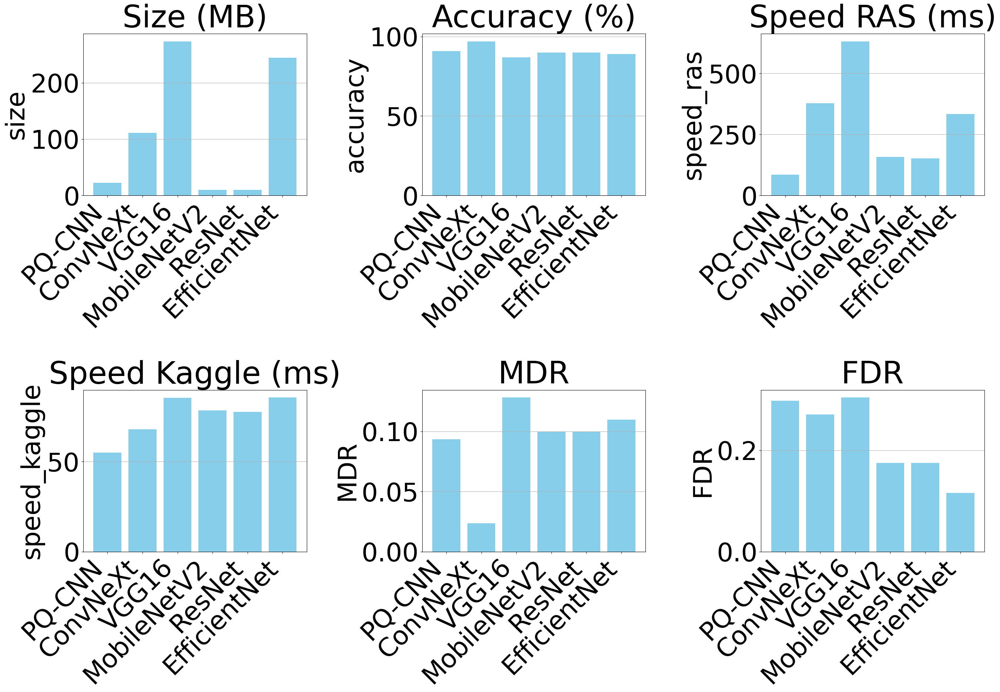

In [12]:
import pandas as pd
import matplotlib.pyplot as plt

# dataset of models
models = [
    {
        'name': 'PQ-CNN',
        'size': 22.28,
        'accuracy': 91.0,
        'speed_ras': 84.32,
        'speed_kaggle':  55.0,
        'MDR': 0.0935,
        'FDR': 0.2979
    },
    {
        'name': 'ConvNeXt',
        'size': 111.36,
        'accuracy': 97.0,
        'speed_ras': 378.0,
        'speed_kaggle': 68.0,
        'MDR': 0.0235,
        'FDR': 0.2712
    },
    {
        'name': 'VGG16',
        'size': 273.56,
        'accuracy': 87.0,
        'speed_ras': 630.6,
        'speed_kaggle': 85.5,
        'MDR': 0.1281,
        'FDR': 0.3043
    },
    {
        'name': 'MobileNetV2',
        'size': 9.6,
        'accuracy': 90.0,
        'speed_ras': 157.6,
        'speed_kaggle': 78.4,
        'MDR': 0.0999,
        'FDR': 0.1753
    },
    {
        'name': 'ResNet',
        'size': 9.58,
        'accuracy': 90.0,
        'speed_ras': 151.4,
        'speed_kaggle': 77.6,
        'MDR': 0.0999,
        'FDR': 0.1753
    },
    {
        'name': 'EfficientNet',
        'size': 244.22,
        'accuracy': 89.0,
        'speed_ras': 333.0,
        'speed_kaggle': 85.6,
        'MDR': 0.1098,
        'FDR': 0.1159
    }
]

# create DataFrame
df = pd.DataFrame(models)


# draw plots
fig, axes = plt.subplots(2, 3, figsize=(28, 20))
axes = axes.flatten()

parameters = ['size', 'accuracy', 'speed_ras', 'speed_kaggle', 'MDR', 'FDR']
titles = ['Size (MB)', 'Accuracy (%)', 'Speed RAS (ms)', 
          'Speed Kaggle (ms)', 'MDR', 'FDR']

for i, param in enumerate(parameters):
    ax = axes[i]
    ax.bar(df['name'], df[param], color='skyblue')
    ax.set_title(titles[i])
    ax.set_ylabel(param)
    ax.set_xticklabels(df['name'], rotation=45, ha='right')
    ax.grid(axis='y')
    
plt.rcParams.update({'font.size': 50})
plt.tight_layout()

# save image plot
plt.savefig('bieu_do_mo_hinh.png')  
# show image plot
plt.show()


In [16]:
import pandas as pd

# dataset of models
models = [
    {
        'name': 'PQ-CNN',
        'size': 22.28,
        'accuracy': 91.0,
        'speed_ras': 84.32,
        'speed_kaggle':  55.0,
        'MDR': 0.0935,
        'FDR': 0.2979
    },
    {
        'name': 'ConvNeXt',
        'size': 111.36,
        'accuracy': 97.0,
        'speed_ras': 378.0,
        'speed_kaggle': 68.0,
        'MDR': 0.0235,
        'FDR': 0.2712
    },
    {
        'name': 'VGG16',
        'size': 273.56,
        'accuracy': 87.0,
        'speed_ras': 630.6,
        'speed_kaggle': 85.5,
        'MDR': 0.1281,
        'FDR': 0.3043
    },
    {
        'name': 'MobileNetV2',
        'size': 9.6,
        'accuracy': 90.0,
        'speed_ras': 157.6,
        'speed_kaggle': 78.4,
        'MDR': 0.0999,
        'FDR': 0.1753
    },
    {
        'name': 'ResNet',
        'size': 9.58,
        'accuracy': 90.0,
        'speed_ras': 151.4,
        'speed_kaggle': 77.6,
        'MDR': 0.0999,
        'FDR': 0.1753
    },
    {
        'name': 'EfficientNet',
        'size': 244.22,
        'accuracy': 89.0,
        'speed_ras': 333.0,
        'speed_kaggle': 85.6,
        'MDR': 0.1098,
        'FDR': 0.1159
    }
]

# convert to DataFrame
df = pd.DataFrame(models)

# parameters
parameters = ['size', 'accuracy', 'speed_ras', 'speed_kaggle', 'MDR', 'FDR']

# get min and max
def get_model_for_value(column, find_max=True):
    if find_max:
        idx = df[column].idxmax()
    else:
        idx = df[column].idxmin()
    return df.iloc[idx]['name']

# create table 1: min size, max accuracy, min speed1, speed2, MDR, FDR
table1_data = {
    'Parameter': parameters,
    'Value': [
        df['size'].min(),
        df['accuracy'].max(),
        df['speed_ras'].min(),
        df['speed_kaggle'].min(),
        df['MDR'].min(),
        df['FDR'].min()
    ],
    'Model': [
        get_model_for_value('size', find_max=False),
        get_model_for_value('accuracy', find_max=True),
        get_model_for_value('speed_ras', find_max=False),
        get_model_for_value('speed_kaggle', find_max=False),
        get_model_for_value('MDR', find_max=False),
        get_model_for_value('FDR', find_max=False)
    ]
}

# create table 2: max size, min accuracy, max speed1, speed2, MDR, FDR
table2_data = {
    'Parameter': parameters,
    'Value': [
        df['size'].max(),
        df['accuracy'].min(),
        df['speed_ras'].max(),
        df['speed_kaggle'].max(),
        df['MDR'].max(),
        df['FDR'].max()
    ],
    'Model': [
        get_model_for_value('size', find_max=True),
        get_model_for_value('accuracy', find_max=False),
        get_model_for_value('speed_ras', find_max=True),
        get_model_for_value('speed_kaggle', find_max=True),
        get_model_for_value('MDR', find_max=True),
        get_model_for_value('FDR', find_max=True)
    ]
}

# Convert to DataFrame
df_table1 = pd.DataFrame(table1_data)
df_table2 = pd.DataFrame(table2_data)

print("Table 1 (Min size, Max accuracy, Min speed_ras, speed_kaggle, MDR, FDR")
print(df_table1)

print("\nTable 2 (Max size, Min accuracy, Max speed_ras, speed_kaggle, MDR, FDR")
print(df_table2)


Table 1 (Min size, Max accuracy, Min speed_ras, speed_kaggle, MDR, FDR
      Parameter    Value         Model
0          size   9.5800        ResNet
1      accuracy  97.0000      ConvNeXt
2     speed_ras  84.3200        PQ-CNN
3  speed_kaggle  55.0000        PQ-CNN
4           MDR   0.0235      ConvNeXt
5           FDR   0.1159  EfficientNet

Table 2 (Max size, Min accuracy, Max speed_ras, speed_kaggle, MDR, FDR
      Parameter     Value         Model
0          size  273.5600         VGG16
1      accuracy   87.0000         VGG16
2     speed_ras  630.6000         VGG16
3  speed_kaggle   85.6000  EfficientNet
4           MDR    0.1281         VGG16
5           FDR    0.3043         VGG16
